# Deep Learning with Keras and TensorFlow Project
## Lending Club Loan Data Analysis

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split, StratifiedKFold

from sklearn.metrics import accuracy_score, confusion_matrix , classification_report, roc_auc_score, RocCurveDisplay, roc_curve, auc

In [2]:
from tensorflow import keras

from keras import layers
from keras.callbacks import EarlyStopping

In [3]:
original_df = pd.read_csv("loan_data.csv")

original_df.head()

,credit.policy,purpose,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
0,1,debt_consolidation,0.1189,829.10,11.350407,19.48,737,5639.958333,28854,52.1,0,0,0,0
1,1,credit_card,0.1071,228.22,11.082143,14.29,707,2760.000000,33623,76.7,0,0,0,0
2,1,debt_consolidation,0.1357,366.86,10.373491,11.63,682,4710.000000,3511,25.6,1,0,0,0
3,1,debt_consolidation,0.1008,162.34,11.350407,8.10,712,2699.958333,33667,73.2,1,0,0,0
4,1,credit_card,0.1426,102.92,11.299732,14.97,667,4066.000000,4740,39.5,0,1,0,0


In [4]:
# Verifying the Data
original_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9578 entries, 0 to 9577
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   credit.policy      9578 non-null   int64  
 1   purpose            9578 non-null   object 
 2   int.rate           9578 non-null   float64
 3   installment        9578 non-null   float64
 4   log.annual.inc     9578 non-null   float64
 5   dti                9578 non-null   float64
 6   fico               9578 non-null   int64  
 7   days.with.cr.line  9578 non-null   float64
 8   revol.bal          9578 non-null   int64  
 9   revol.util         9578 non-null   float64
 10  inq.last.6mths     9578 non-null   int64  
 11  delinq.2yrs        9578 non-null   int64  
 12  pub.rec            9578 non-null   int64  
 13  not.fully.paid     9578 non-null   int64  
dtypes: float64(6), int64(7), object(1)
memory usage: 1.0+ MB


In [5]:
# Checking the values for each column
for c in original_df.columns:
    print(original_df[c].describe())
    print("\n")

count    9578.000000
mean        0.804970
std         0.396245
min         0.000000
25%         1.000000
50%         1.000000
75%         1.000000
max         1.000000
Name: credit.policy, dtype: float64


count                   9578
unique                     7
top       debt_consolidation
freq                    3957
Name: purpose, dtype: object


count    9578.000000
mean        0.122640
std         0.026847
min         0.060000
25%         0.103900
50%         0.122100
75%         0.140700
max         0.216400
Name: int.rate, dtype: float64


count    9578.000000
mean      319.089413
std       207.071301
min        15.670000
25%       163.770000
50%       268.950000
75%       432.762500
max       940.140000
Name: installment, dtype: float64


count    9578.000000
mean       10.932117
std         0.614813
min         7.547502
25%        10.558414
50%        10.928884
75%        11.291293
max        14.528354
Name: log.annual.inc, dtype: float64


count    9578.000000
mean       12.

In [6]:
original_df["credit.policy"].value_counts()

credit.policy
1    7710
0    1868
Name: count, dtype: int64

In [7]:
original_df["not.fully.paid"].value_counts()

not.fully.paid
0    8045
1    1533
Name: count, dtype: int64

### Exploratory Data Analysis

In [8]:
df = original_df.copy()

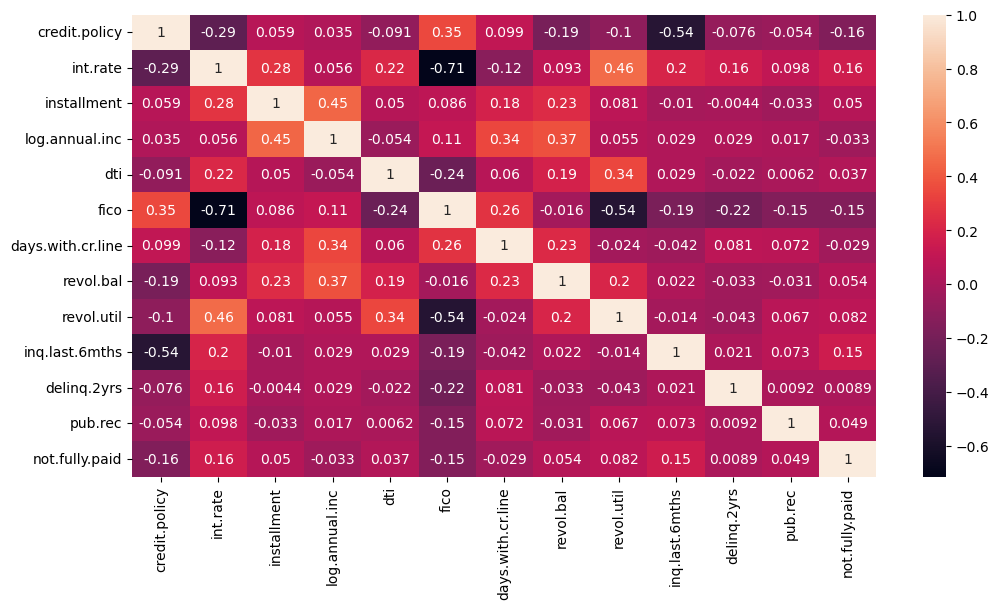

In [9]:
ax = sns.heatmap(df.drop(["purpose"], axis=1).corr(), annot=True)
ax.figure.set_size_inches(12,6)

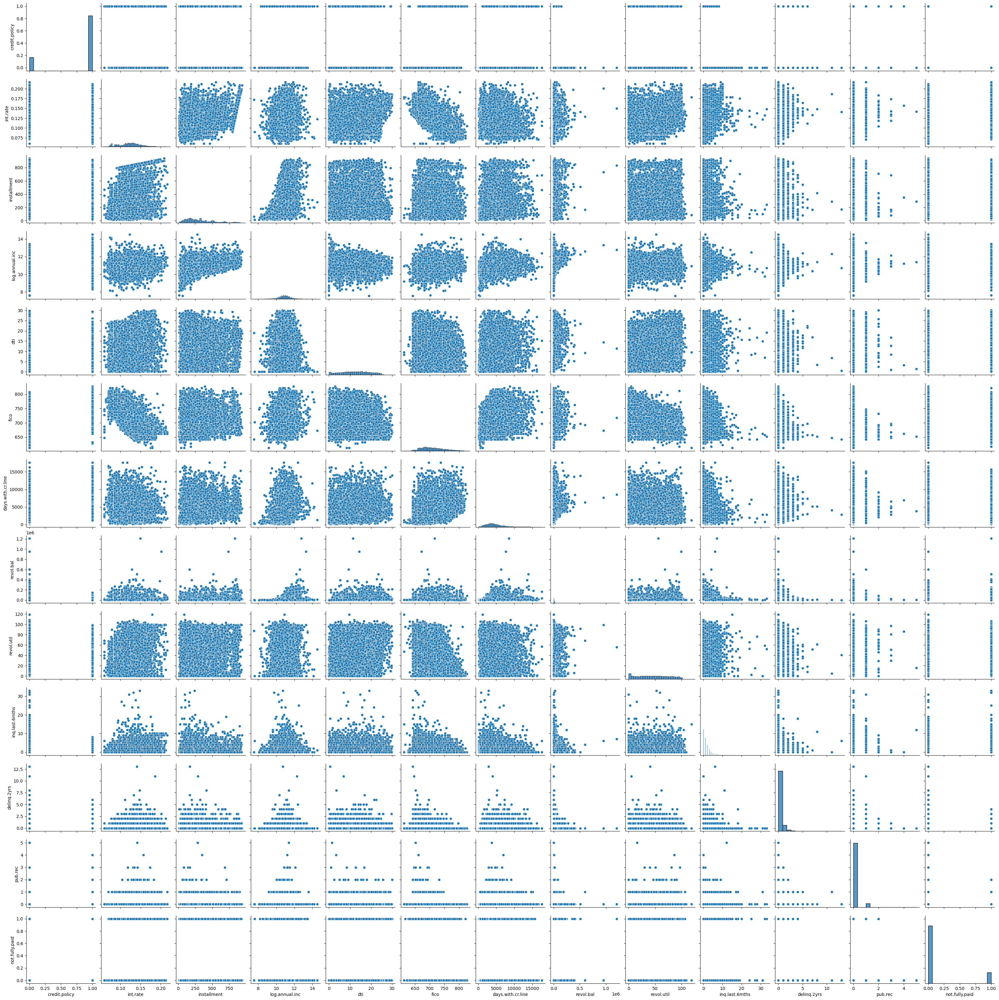

In [10]:
sns.pairplot(df.drop(["purpose"], axis = 1))

In [11]:
df.columns

Index(['credit.policy', 'purpose', 'int.rate', 'installment', 'log.annual.inc',
       'dti', 'fico', 'days.with.cr.line', 'revol.bal', 'revol.util',
       'inq.last.6mths', 'delinq.2yrs', 'pub.rec', 'not.fully.paid'],
      dtype='object')

In [12]:
pd.crosstab(df["credit.policy"], df["purpose"], margins=True, margins_name="All").shape

(3, 8)

In [13]:
cr_pur_mask = np.zeros((3, 8))
cr_pur_mask[-1:] = True
cr_pur_mask[:, -1:] = True

cr_pur_mask2 = np.zeros((3, 8))
cr_pur_mask2[:2,:7] = True

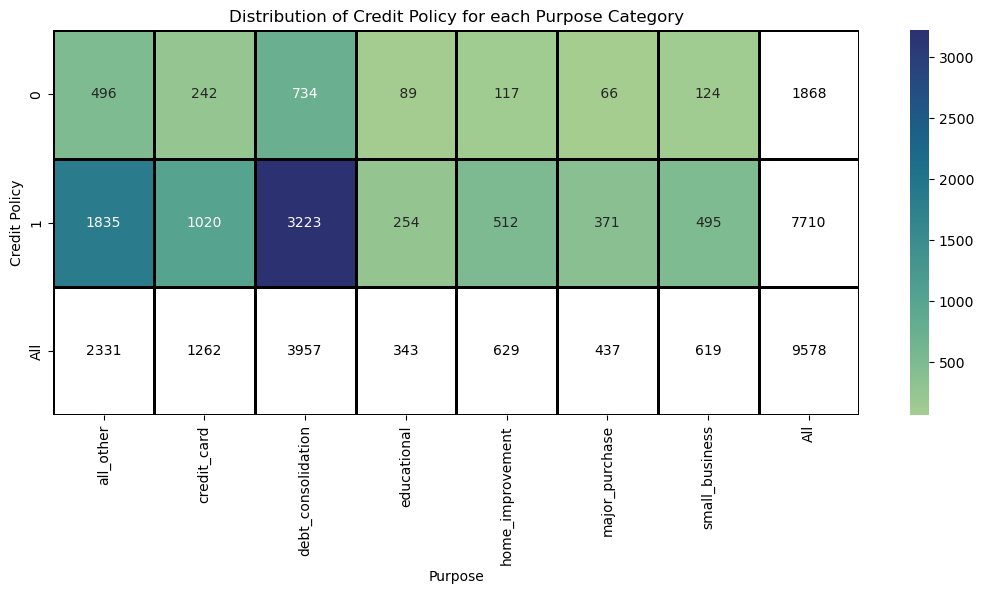

In [14]:
plt.subplots(figsize = (13, 5))
plt.title("Distribution of Credit Policy for each Purpose Category")
ax = sns.heatmap(pd.crosstab(df["credit.policy"], df["purpose"], margins=True, margins_name="All"), annot=True, fmt="3d", mask=cr_pur_mask,
                cmap="crest", linewidths=1, linecolor='black')
ax2 = sns.heatmap(pd.crosstab(df["credit.policy"], df["purpose"], margins=True, margins_name="All"), alpha=0, cbar=False, annot=True,
                  annot_kws={"color":"black"}, mask = cr_pur_mask2, fmt="3d")
ax2.set(xlabel="Purpose", ylabel="Credit Policy")
plt.show()

In [15]:
mask = np.zeros((3, 3))
mask[-1:] = True
mask[:, -1:] = True

mask2 = np.zeros((3, 3))
mask2[:2,:2] = True

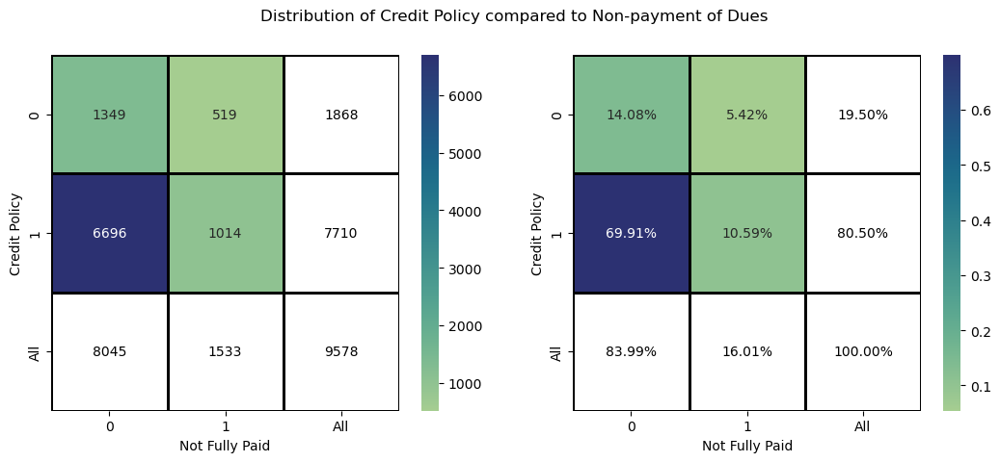

In [16]:
fig, ax = plt.subplots(1, 2, figsize=(12.8, 4.8))
fig.suptitle("Distribution of Credit Policy compared to Non-payment of Dues")

plt.subplot(1,2,1)
ax = sns.heatmap(pd.crosstab(df["credit.policy"], df["not.fully.paid"], margins=True, margins_name="All"), annot=True, fmt="3d", mask=mask,
                cmap="crest", linewidths=1, linecolor='black')
ax2 = sns.heatmap(pd.crosstab(df["credit.policy"], df["not.fully.paid"], margins=True, margins_name="All"), alpha=0, cbar=False, annot=True,
                  annot_kws={"color":"black"}, mask = mask2, fmt="3d")
ax2.set(xlabel="Not Fully Paid", ylabel="Credit Policy")

plt.subplot(1,2,2)
ax = sns.heatmap(pd.crosstab(df["credit.policy"], df["not.fully.paid"], margins=True, margins_name="All", normalize=True), annot=True,
                 fmt=".2%", mask=mask, cmap="crest", linewidths=1, linecolor='black')
ax2 = sns.heatmap(pd.crosstab(df["credit.policy"], df["not.fully.paid"], margins=True, margins_name="All", normalize=True), alpha=0, cbar=False,
                  annot=True, annot_kws={"color":"black"}, mask = mask2, fmt=".2%")
ax.set(xlabel="Not Fully Paid", ylabel="Credit Policy")

plt.show()

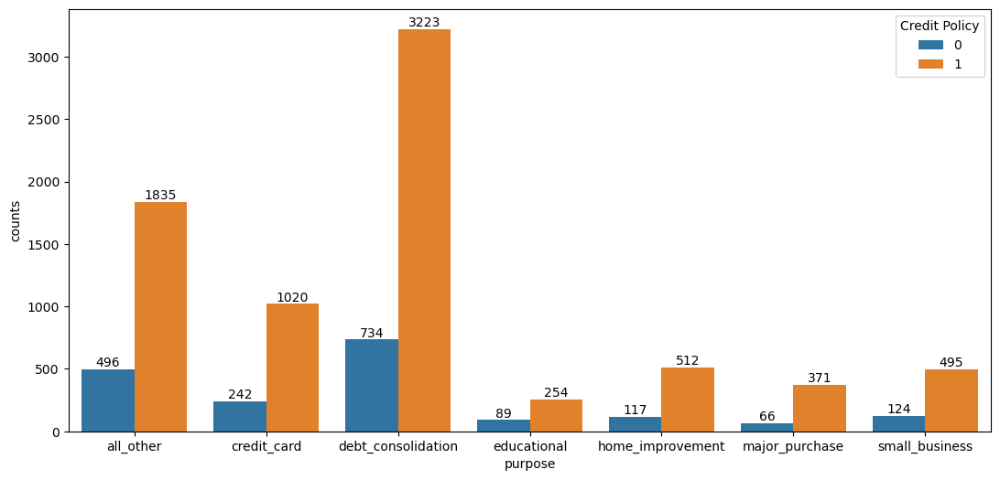

In [17]:
grp1 = df.groupby(by = ["purpose", "credit.policy"], sort=True).size().reset_index(name='counts')

plt.subplots(figsize = (13, 6))
ax = sns.barplot(data=grp1, x="purpose", y="counts", hue="credit.policy")

for i in ax.containers:
    ax.bar_label(i,)

legend_handles, _= ax.get_legend_handles_labels()
plt.legend(title = "Credit Policy")
plt.show()

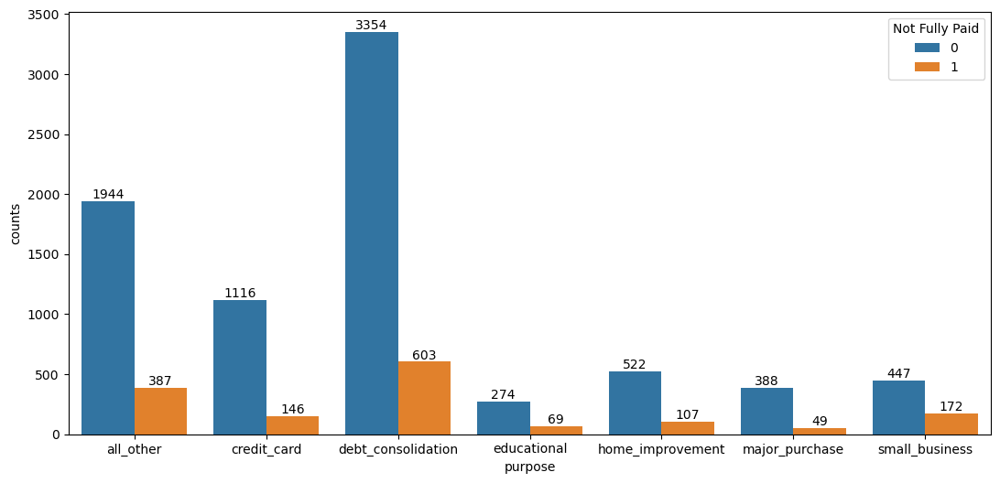

In [18]:
grp1 = df.groupby(by = ["purpose", "not.fully.paid"], sort=True).size().reset_index(name='counts')

plt.subplots(figsize = (13, 6))
ax = sns.barplot(data=grp1, x="purpose", y="counts", hue="not.fully.paid")

for i in ax.containers:
    ax.bar_label(i,)

legend_handles, _= ax.get_legend_handles_labels()
plt.legend(title = "Not Fully Paid")
plt.show()

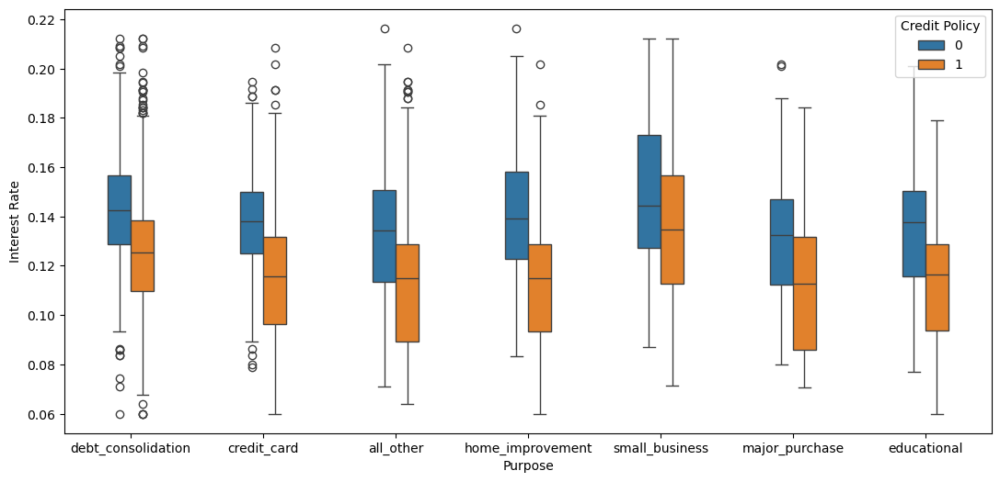

In [19]:
plt.subplots(figsize = (13, 6))
ax = sns.boxplot(data = df, x = "purpose", y = "int.rate", hue = "credit.policy" , width= 0.35, legend=True)
ax.set(xlabel="Purpose", ylabel="Interest Rate")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(title = "Credit Policy")
plt.show()

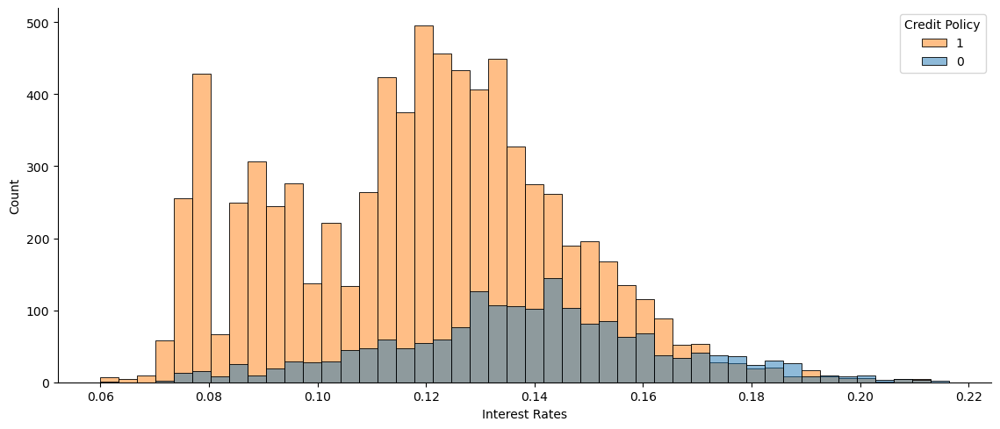

In [20]:
ax = sns.displot(df, x = "int.rate", hue = "credit.policy", legend=False)
ax.figure.set_size_inches(13,5)
ax.set(xlabel = "Interest Rates")

plt.legend(title = "Credit Policy", labels = ['1','0'])
plt.show()

In [21]:
df["installment"].describe()

count    9578.000000
mean      319.089413
std       207.071301
min        15.670000
25%       163.770000
50%       268.950000
75%       432.762500
max       940.140000
Name: installment, dtype: float64

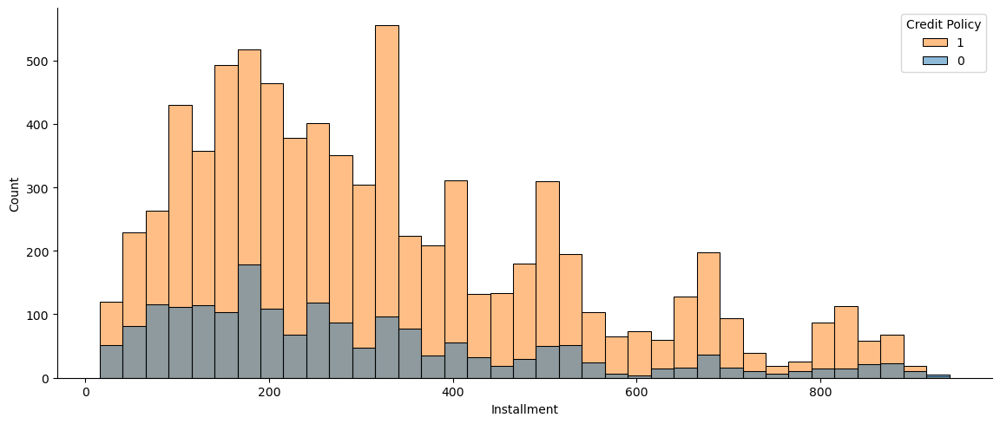

In [22]:
ax = sns.displot(df, x = "installment", hue = "credit.policy", legend=False)
ax.figure.set_size_inches(13,5)
ax.set(xlabel = "Installment")

plt.legend(title = "Credit Policy", labels = ['1','0'])
plt.show()

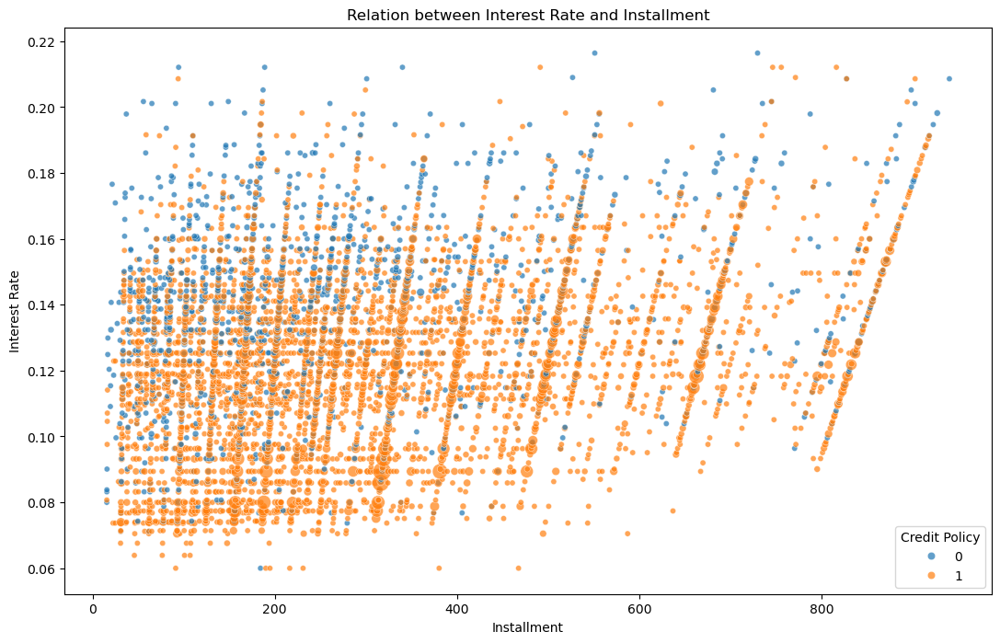

In [23]:
grp2 = df.groupby(["int.rate", "installment", "credit.policy"]).size().reset_index(name = "Count")
plt.subplots(figsize=(13, 8))
plt.title("Relation between Interest Rate and Installment")
ax = sns.scatterplot(data=grp2, x="installment", y="int.rate", hue="credit.policy", size="Count", sizes=(20, 200), legend = True, alpha=0.7)
ax.set(xlabel="Installment", ylabel="Interest Rate")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(legend_handles[1:3], [ '0','1'], title = "Credit Policy", loc="lower right") # title = "Credit Policy", labels =
plt.show()

In [24]:
df["annual.inc"] = np.exp(df["log.annual.inc"])
df["annual.inc"].describe().round()

count       9578.0
mean       68402.0
std        61228.0
min         1896.0
25%        38500.0
50%        55764.0
75%        80121.0
max      2039784.0
Name: annual.inc, dtype: float64

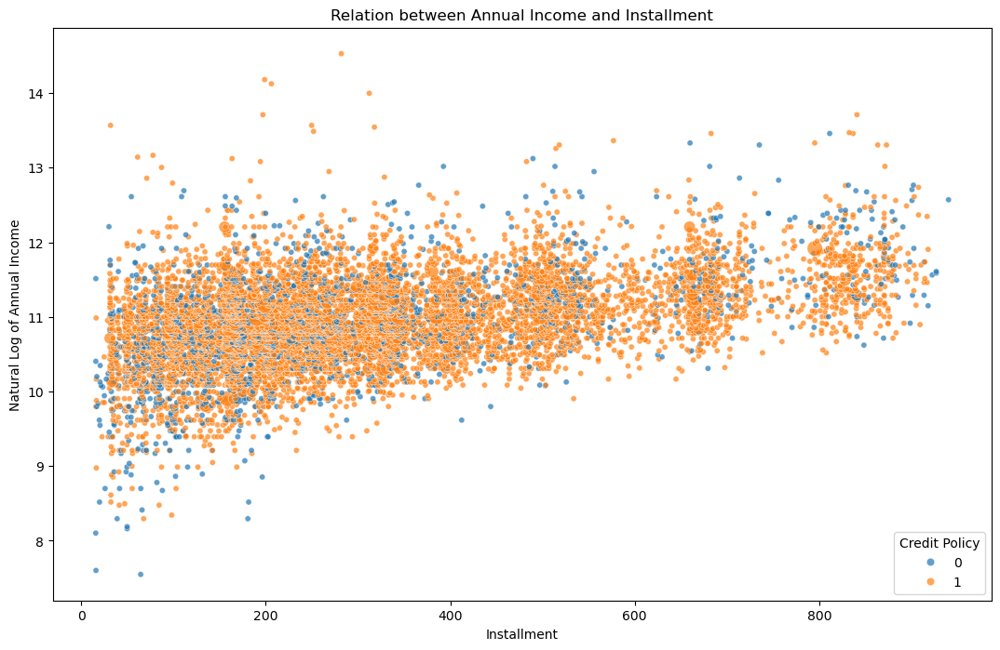

In [25]:
grp3 = df.groupby(["log.annual.inc", "installment", "credit.policy"]).size().reset_index(name = "Count")
plt.subplots(figsize=(13, 8))
plt.title("Relation between Annual Income and Installment")
ax = sns.scatterplot(data=grp3, x="installment", y="log.annual.inc", hue="credit.policy", size="Count", sizes=(20, 200), legend = True, alpha=0.7)
ax.set(xlabel="Installment", ylabel="Natural Log of Annual Income")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(legend_handles[1:3], [ '0','1'], title = "Credit Policy", loc="lower right") # title = "Credit Policy", labels =
plt.show()

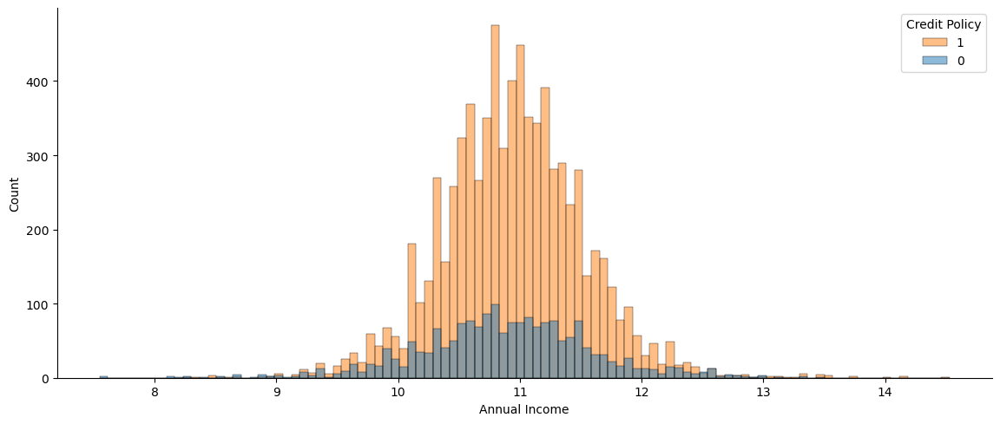

In [26]:
ax = sns.displot(df, x = "log.annual.inc", hue = "credit.policy", legend=False)
ax.figure.set_size_inches(13,5)
ax.set(xlabel = "Annual Income")

plt.legend(title = "Credit Policy", labels = ['1','0'])
plt.show()

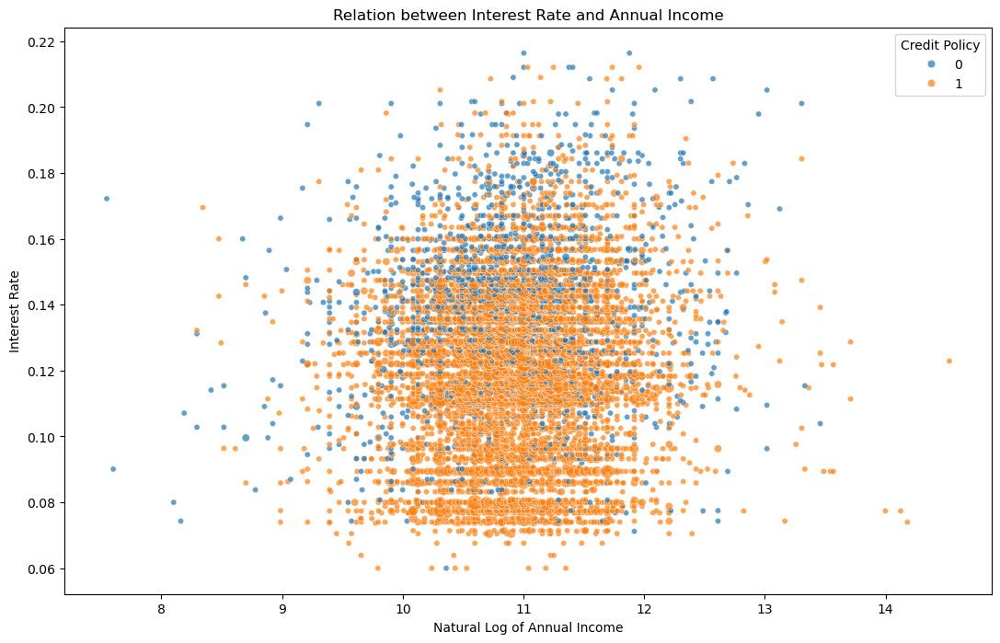

In [27]:
grp4 = df.groupby(["int.rate", "log.annual.inc", "credit.policy"]).size().reset_index(name = "Count")
plt.subplots(figsize=(13, 8))
plt.title("Relation between Interest Rate and Annual Income")
ax = sns.scatterplot(data=grp4, x="log.annual.inc", y="int.rate", hue="credit.policy", size="Count", sizes=(20, 200), legend = True, alpha=0.7)
ax.set(xlabel="Natural Log of Annual Income", ylabel="Interest Rate")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(legend_handles[1:3], [ '0','1'], title = "Credit Policy")
plt.show()

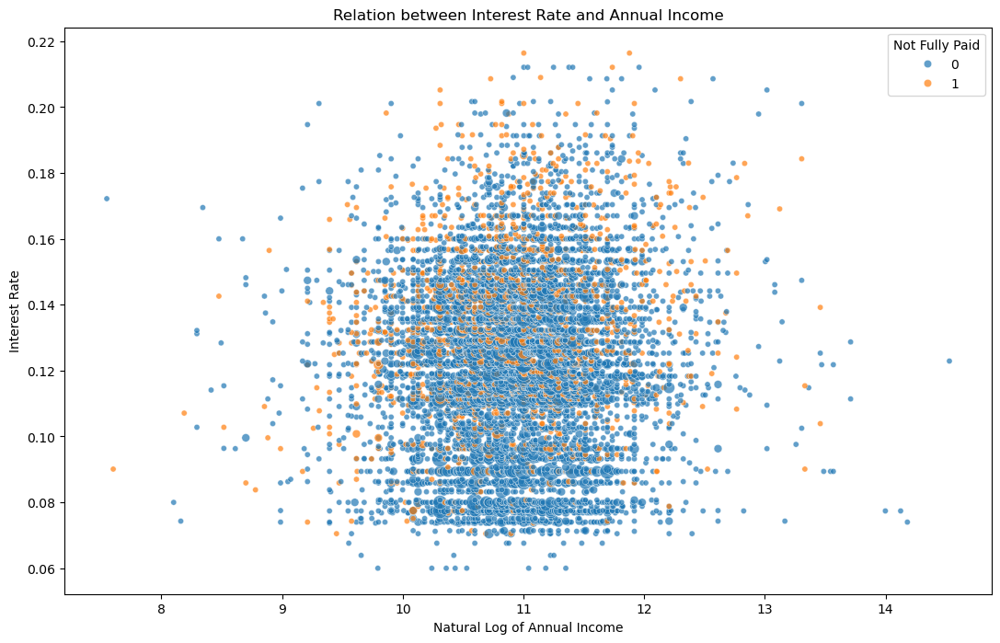

In [28]:
grp5 = df.groupby(["int.rate", "log.annual.inc", "not.fully.paid"]).size().reset_index(name = "Count")
plt.subplots(figsize=(13, 8))
plt.title("Relation between Interest Rate and Annual Income")
ax = sns.scatterplot(data=grp5, x="log.annual.inc", y="int.rate", hue="not.fully.paid", size="Count", sizes=(20, 200), legend = True, alpha=0.7)
ax.set(xlabel="Natural Log of Annual Income", ylabel="Interest Rate")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(legend_handles[1:3], [ '0','1'], title = "Not Fully Paid") # title = "Credit Policy", labels =
plt.show()

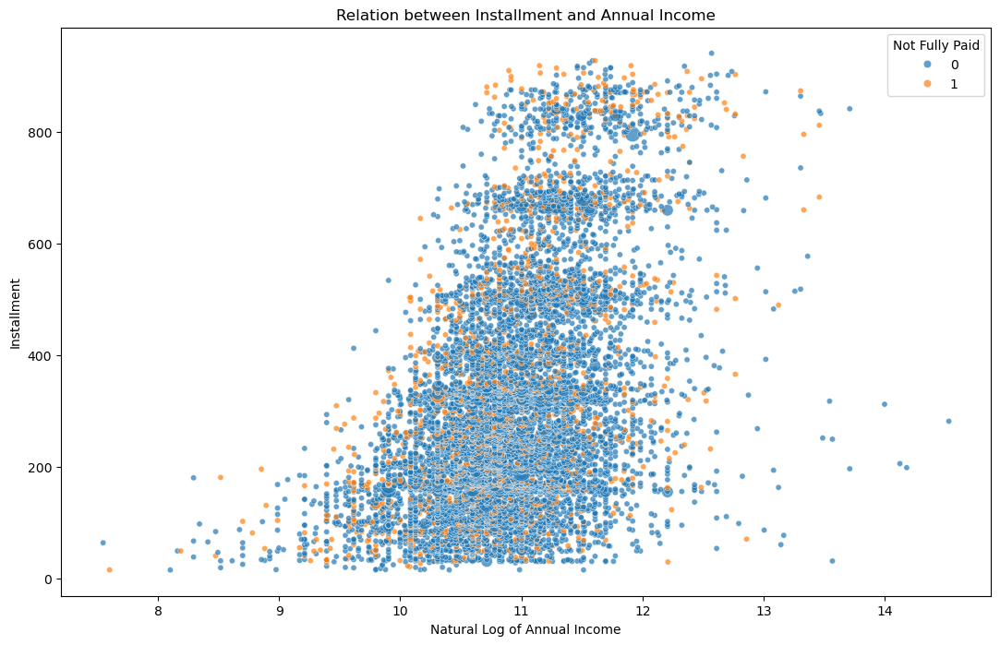

In [29]:
grp6 = df.groupby(["installment", "log.annual.inc", "not.fully.paid"]).size().reset_index(name = "Count")
plt.subplots(figsize=(13, 8))
plt.title("Relation between Installment and Annual Income")
ax = sns.scatterplot(data=grp6, x="log.annual.inc", y="installment", hue="not.fully.paid", size="Count", sizes=(20, 200), legend = True, alpha=0.7)
ax.set(xlabel="Natural Log of Annual Income", ylabel="Installment")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(legend_handles[1:3], [ '0','1'], title = "Not Fully Paid") # title = "Credit Policy", labels =
plt.show()

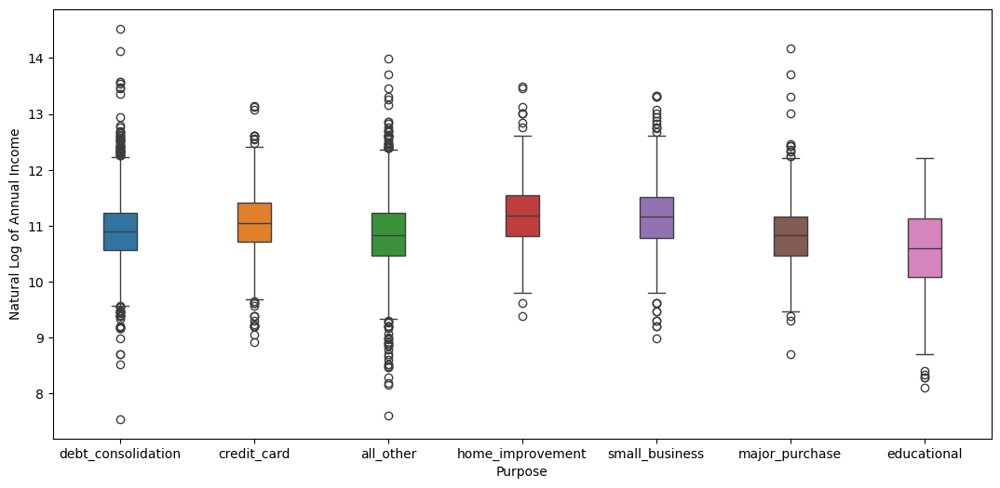

In [30]:
plt.subplots(figsize = (13, 6))
ax = sns.boxplot(data = df, x = "purpose", y = "log.annual.inc", hue = "purpose" , width= 0.25, legend=False)
ax.set(xlabel="Purpose", ylabel="Natural Log of Annual Income")
plt.show()

In [31]:
df["dti"].describe()

count    9578.000000
mean       12.606679
std         6.883970
min         0.000000
25%         7.212500
50%        12.665000
75%        17.950000
max        29.960000
Name: dti, dtype: float64

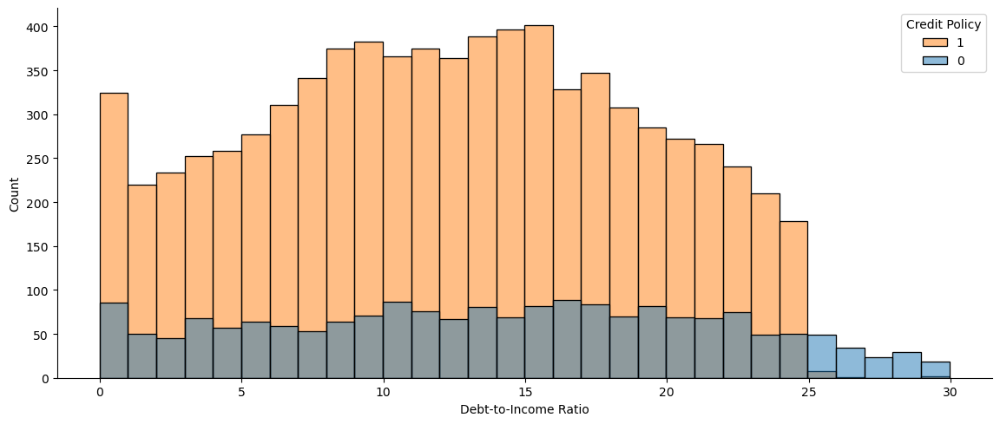

In [32]:
ax = sns.displot(df, x = "dti", hue = "credit.policy", legend=False)
ax.figure.set_size_inches(13,5)
ax.set(xlabel = "Debt-to-Income Ratio")

plt.legend(title = "Credit Policy", labels = ['1','0'])
plt.show()

In [33]:
df[df["credit.policy"] == 1].sort_values(by="dti", ascending=False)["dti"]

1300    29.42
952     29.15
1286    26.05
934     25.43
6671    24.99
        ...  
1188     0.00
3629     0.00
3619     0.00
1310     0.00
343      0.00
Name: dti, Length: 7710, dtype: float64

#### Most people with Debt-to-Income Ratio above 25, do not qualify for Lending Club's Credit Policy.

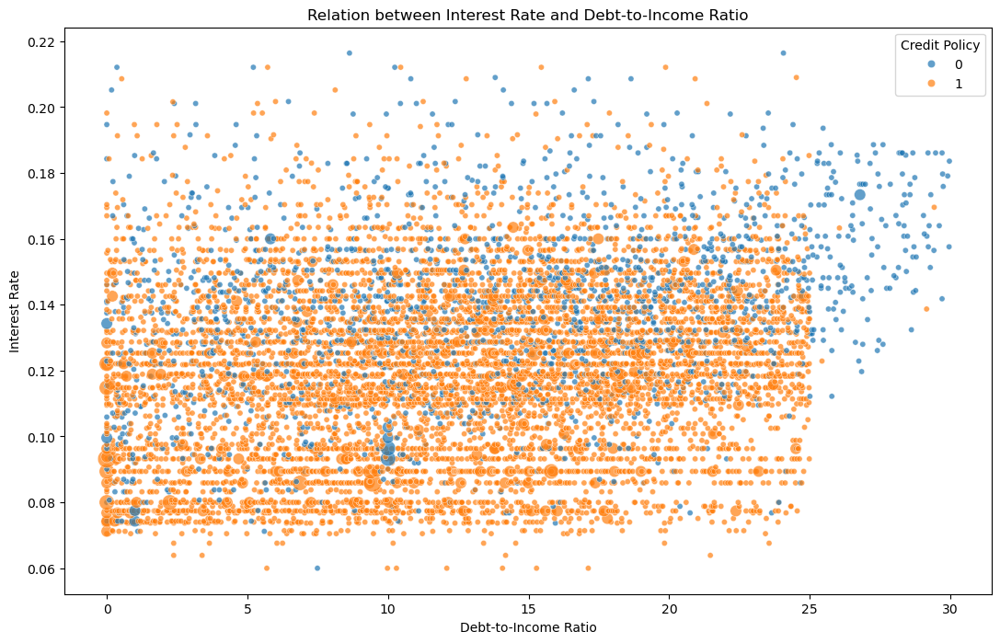

In [34]:
grp7 = df.groupby(["int.rate", "dti", "credit.policy"]).size().reset_index(name = "Count")
plt.subplots(figsize=(13, 8))
plt.title("Relation between Interest Rate and Debt-to-Income Ratio")
ax = sns.scatterplot(data=grp7, x="dti", y="int.rate", hue="credit.policy", size="Count", sizes=(20, 200), legend = True, alpha=0.7)
ax.set(xlabel="Debt-to-Income Ratio", ylabel="Interest Rate")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(legend_handles[1:3], [ '0','1'], title = "Credit Policy")
plt.show()

In [35]:
df["fico"].describe()

count    9578.000000
mean      710.846314
std        37.970537
min       612.000000
25%       682.000000
50%       707.000000
75%       737.000000
max       827.000000
Name: fico, dtype: float64

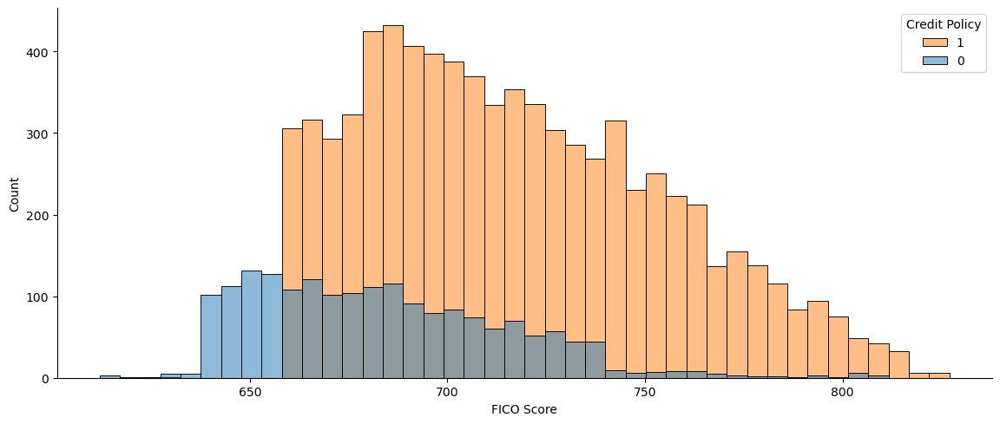

In [36]:
ax = sns.displot(df, x = "fico", hue = "credit.policy", legend=False)
ax.figure.set_size_inches(13,5)
ax.set(xlabel = "FICO Score")

plt.legend(title = "Credit Policy", labels = ['1','0'])
plt.show()

In [37]:
df[df["credit.policy"] == 1].sort_values(by="fico")["fico"]

54      627
170     632
6420    662
4350    662
4361    662
       ... 
1477    822
2495    822
2476    822
1883    822
1613    827
Name: fico, Length: 7710, dtype: int64

#### Most people with FICO Score below 662, do not qualify for Lending Club's Credit Policy.

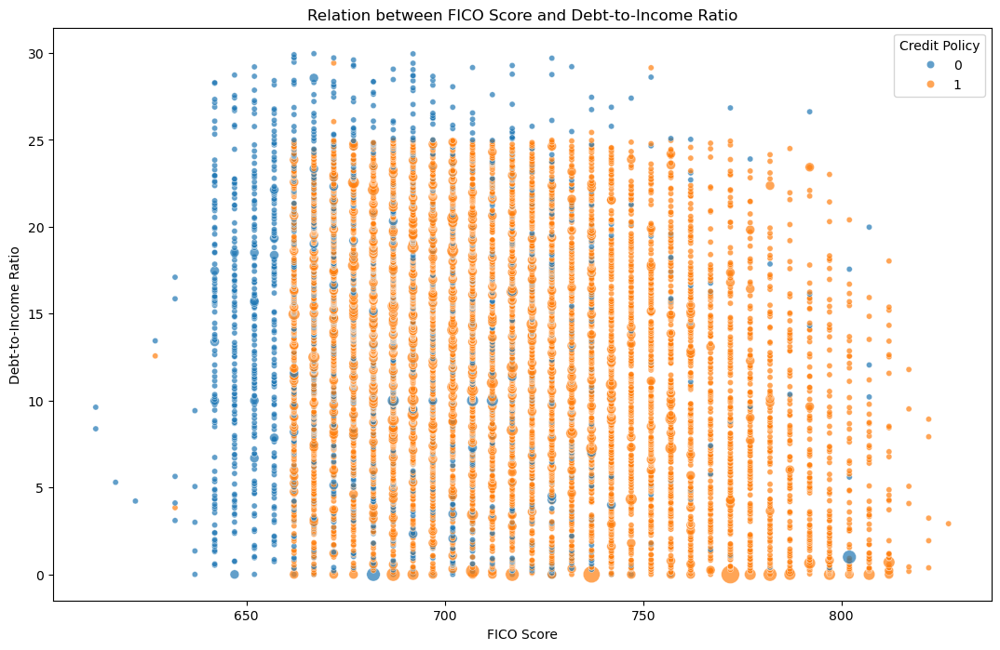

In [38]:
grp8 = df.groupby(["dti", "fico", "credit.policy"]).size().reset_index(name = "Count")
plt.subplots(figsize=(13, 8))
plt.title("Relation between FICO Score and Debt-to-Income Ratio")
ax = sns.scatterplot(data=grp8, x="fico", y="dti", hue="credit.policy", size="Count", sizes=(20, 200), legend = True, alpha=0.7)
ax.set(xlabel="FICO Score", ylabel="Debt-to-Income Ratio")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(legend_handles[1:3], [ '0','1'], title = "Credit Policy")
plt.show()

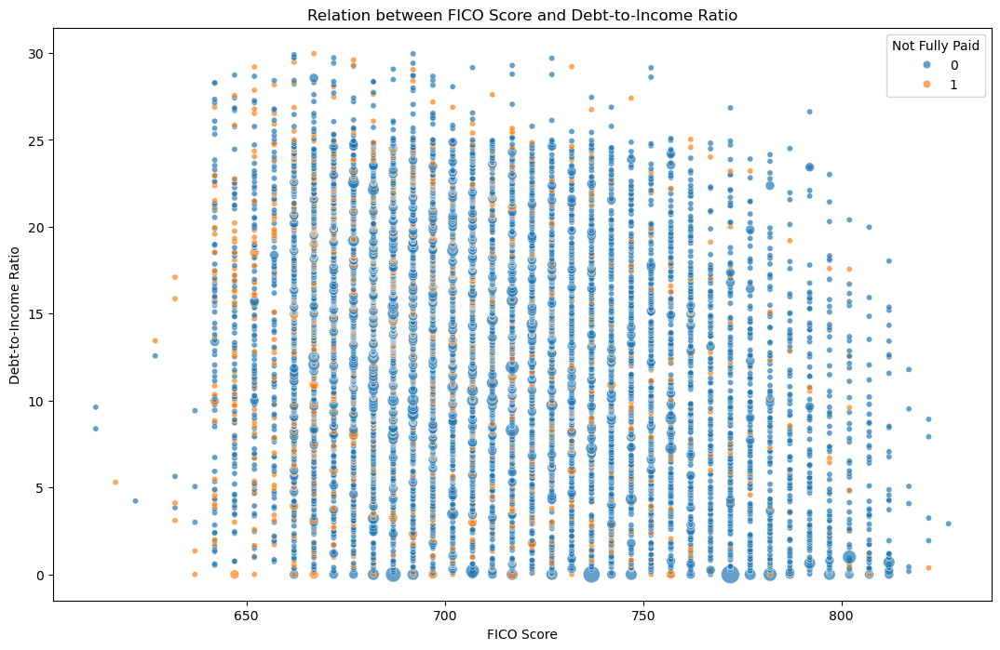

In [39]:
grp9 = df.groupby(["dti", "fico", "not.fully.paid"]).size().reset_index(name = "Count")
plt.subplots(figsize=(13, 8))
plt.title("Relation between FICO Score and Debt-to-Income Ratio")
ax = sns.scatterplot(data=grp9, x="fico", y="dti", hue="not.fully.paid", size="Count", sizes=(20, 200), legend = True, alpha=0.7)
ax.set(xlabel="FICO Score", ylabel="Debt-to-Income Ratio")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(legend_handles[1:3], [ '0','1'], title = "Not Fully Paid") # title = "Credit Policy", labels =
plt.show()

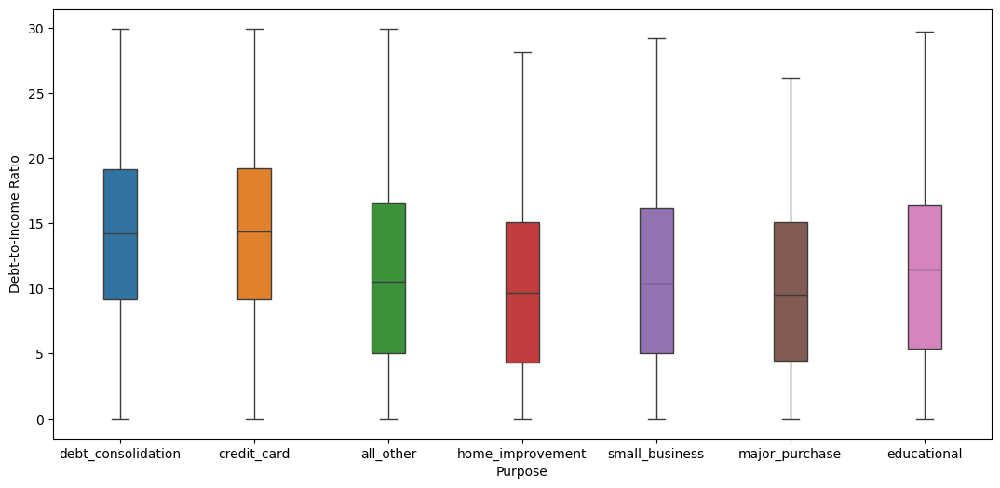

In [40]:
plt.subplots(figsize = (13, 6))
ax = sns.boxplot(data = df, x = "purpose", y = "dti", hue = "purpose" , width= 0.25, legend=False)
ax.set(xlabel="Purpose", ylabel="Debt-to-Income Ratio")
plt.show()

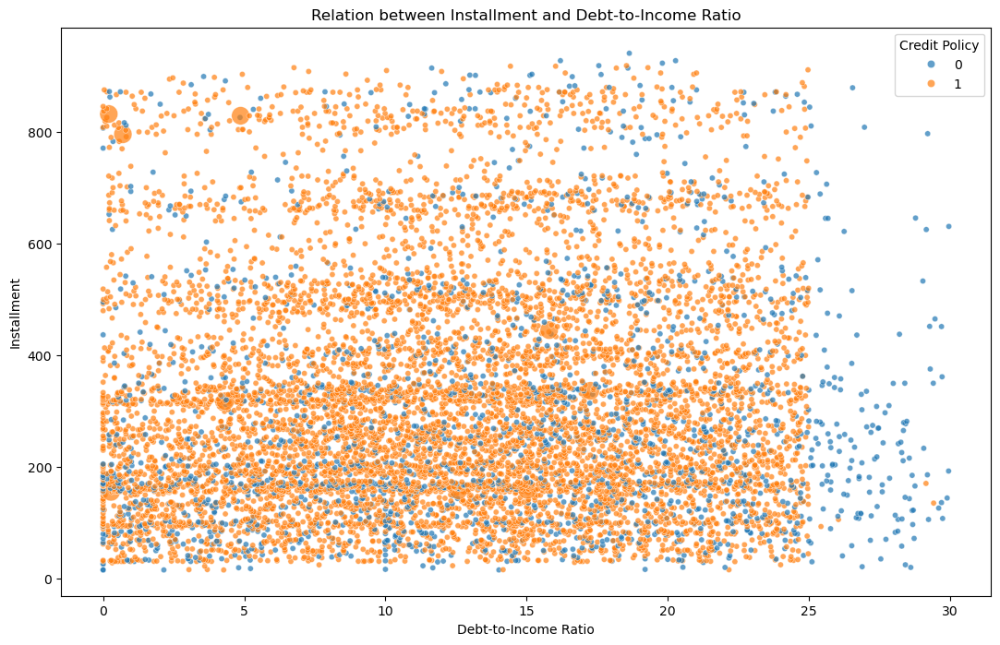

In [41]:
grp10 = df.groupby(["installment", "dti", "credit.policy"]).size().reset_index(name = "Count")
plt.subplots(figsize=(13, 8))
plt.title("Relation between Installment and Debt-to-Income Ratio")
ax = sns.scatterplot(data=grp10, x="dti", y="installment", hue="credit.policy", size="Count", sizes=(20, 200), legend = True, alpha=0.7)
ax.set(xlabel="Debt-to-Income Ratio", ylabel="Installment")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(legend_handles[1:3], [ '0','1'], title = "Credit Policy")
plt.show()

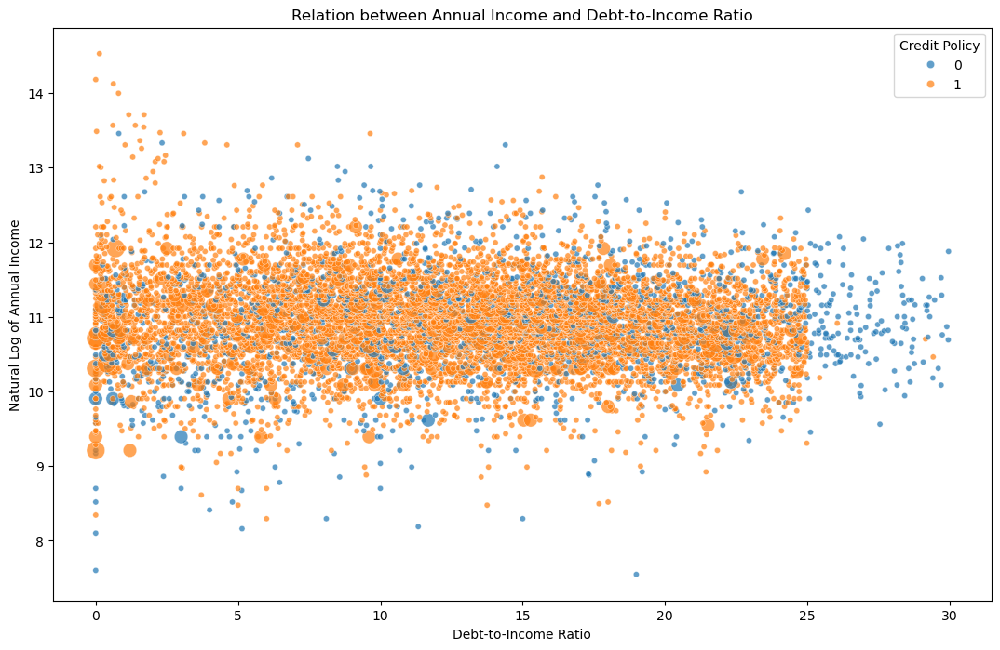

In [42]:
grp11 = df.groupby(["log.annual.inc", "dti", "credit.policy"]).size().reset_index(name = "Count")
plt.subplots(figsize=(13, 8))
plt.title("Relation between Annual Income and Debt-to-Income Ratio")
ax = sns.scatterplot(data=grp11, x="dti", y="log.annual.inc", hue="credit.policy", size="Count", sizes=(20, 200), legend = True, alpha=0.7)
ax.set(xlabel="Debt-to-Income Ratio", ylabel="Natural Log of Annual Income")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(legend_handles[1:3], [ '0','1'], title = "Credit Policy")
plt.show()

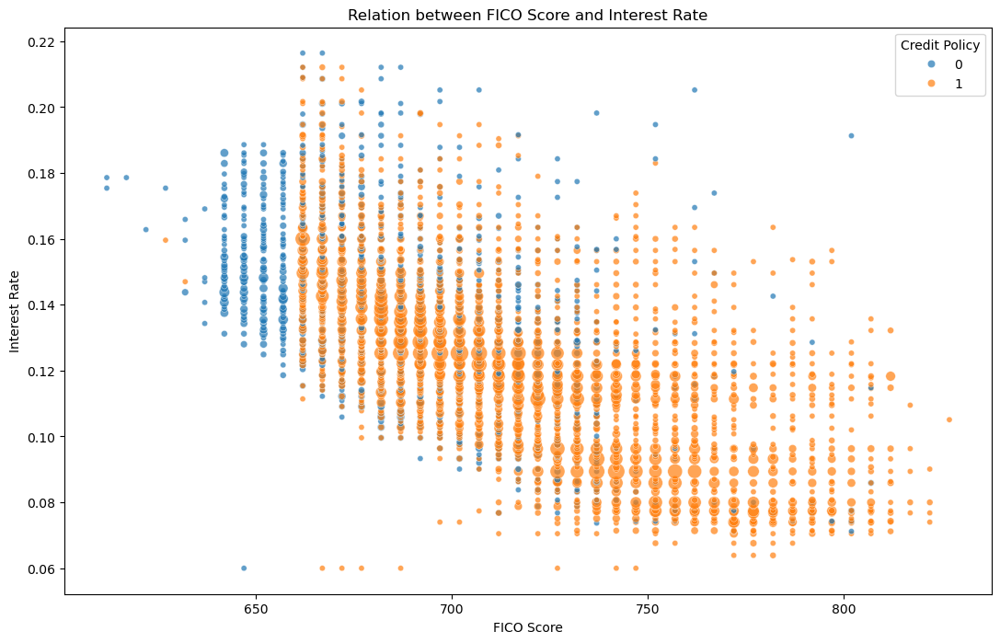

In [43]:
grp12 = df.groupby(["int.rate", "fico", "credit.policy"]).size().reset_index(name = "Count")
plt.subplots(figsize=(13, 8))
plt.title("Relation between FICO Score and Interest Rate")
ax = sns.scatterplot(data=grp12, x="fico", y="int.rate", hue="credit.policy", size="Count", sizes=(20, 200), legend = True, alpha=0.7)
ax.set(xlabel="FICO Score", ylabel="Interest Rate")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(legend_handles[1:3], [ '0','1'], title = "Credit Policy")
plt.show()

#### People with higher FICO Score who qualify for credit undertaking usually have lower Interest Rate.

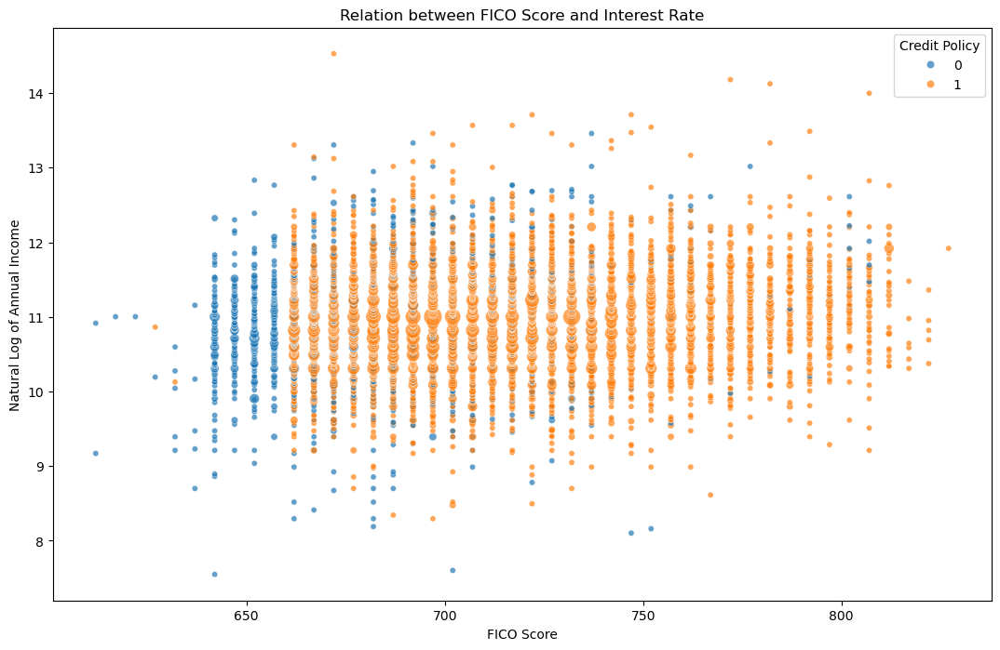

In [44]:
grp13 = df.groupby(["log.annual.inc", "fico", "credit.policy"]).size().reset_index(name = "Count")
plt.subplots(figsize=(13, 8))
plt.title("Relation between FICO Score and Interest Rate")
ax = sns.scatterplot(data=grp13, x="fico", y="log.annual.inc", hue="credit.policy", size="Count", sizes=(20, 200), legend = True, alpha=0.7)
ax.set(xlabel="FICO Score", ylabel="Natural Log of Annual Income")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(legend_handles[1:3], [ '0','1'], title = "Credit Policy")
plt.show()

In [45]:
df["days.with.cr.line"].describe()

count     9578.000000
mean      4560.767197
std       2496.930377
min        178.958333
25%       2820.000000
50%       4139.958333
75%       5730.000000
max      17639.958330
Name: days.with.cr.line, dtype: float64

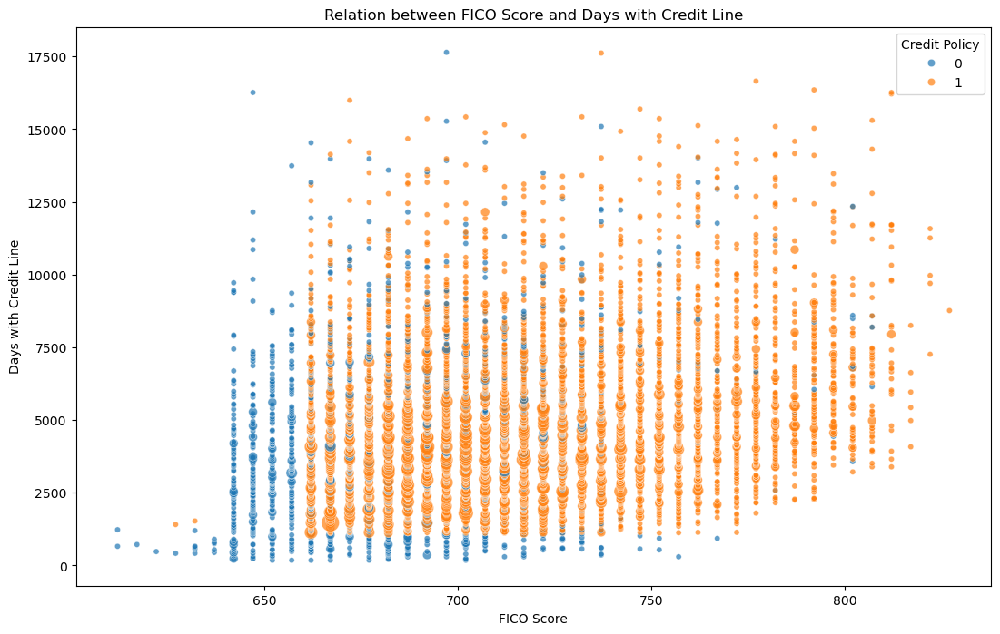

In [46]:
grp14 = df.groupby(["days.with.cr.line", "fico", "credit.policy"]).size().reset_index(name = "Count")
plt.subplots(figsize=(13, 8))
plt.title("Relation between FICO Score and Days with Credit Line")
ax = sns.scatterplot(data=grp14, x="fico", y="days.with.cr.line", hue="credit.policy", size="Count", sizes=(20, 200), legend = True, alpha=0.7)
ax.set(xlabel="FICO Score", ylabel="Days with Credit Line")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(legend_handles[1:3], [ '0','1'], title = "Credit Policy")
plt.show()

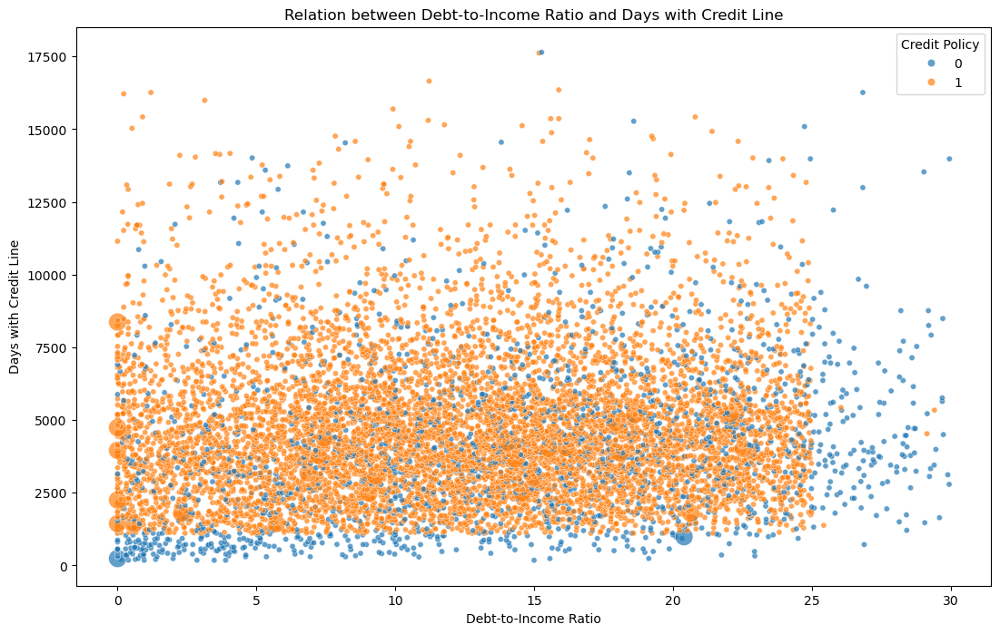

In [47]:
grp15 = df.groupby(["days.with.cr.line", "dti", "credit.policy"]).size().reset_index(name = "Count")
plt.subplots(figsize=(13, 8))
plt.title("Relation between Debt-to-Income Ratio and Days with Credit Line")
ax = sns.scatterplot(data=grp15, x="dti", y="days.with.cr.line", hue="credit.policy", size="Count", sizes=(20, 200), legend = True, alpha=0.7)
ax.set(xlabel="Debt-to-Income Ratio", ylabel="Days with Credit Line")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(legend_handles[1:3], [ '0','1'], title = "Credit Policy")
plt.show()

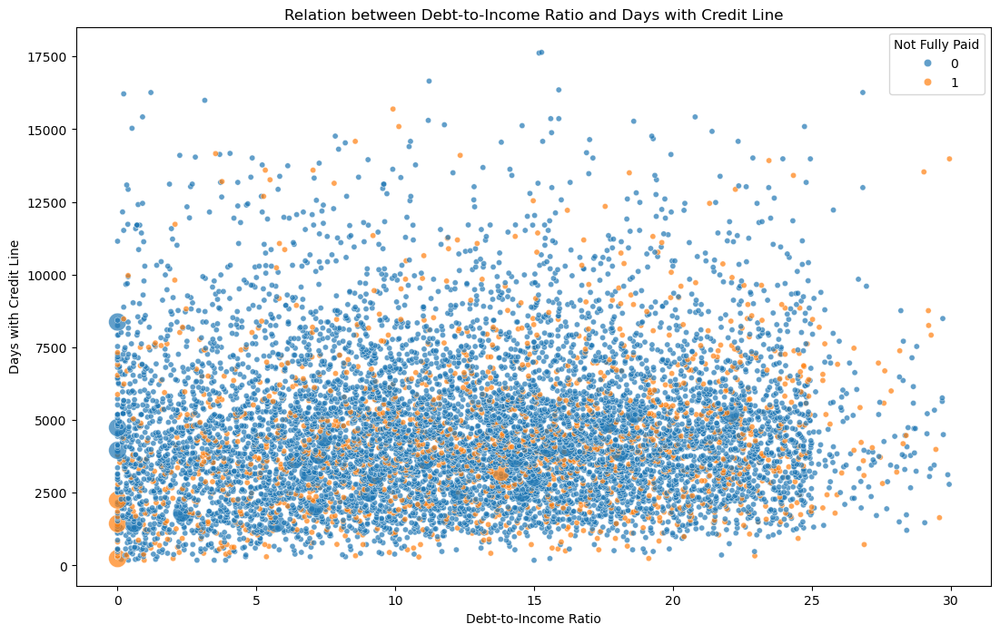

In [48]:
grp16 = df.groupby(["days.with.cr.line", "dti", "not.fully.paid"]).size().reset_index(name = "Count")
plt.subplots(figsize=(13, 8))
plt.title("Relation between Debt-to-Income Ratio and Days with Credit Line")
ax = sns.scatterplot(data=grp16, x="dti", y="days.with.cr.line", hue="not.fully.paid", size="Count", sizes=(20, 200), legend = True, alpha=0.7)
ax.set(xlabel="Debt-to-Income Ratio", ylabel="Days with Credit Line")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(legend_handles[1:3], [ '0','1'], title = "Not Fully Paid")
plt.show()

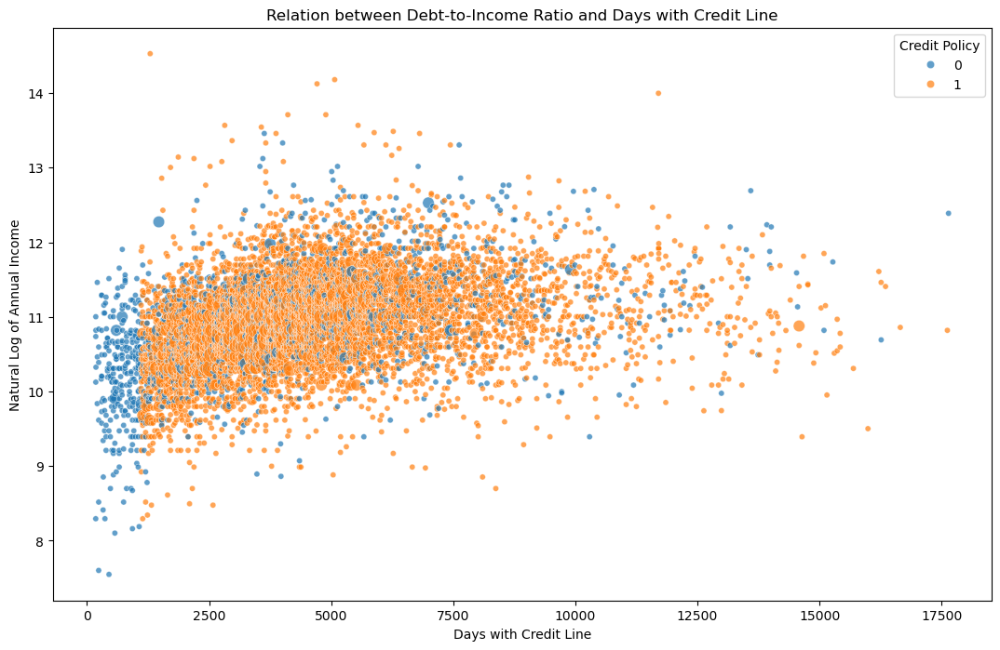

In [49]:
grp17 = df.groupby(["days.with.cr.line", "log.annual.inc", "credit.policy"]).size().reset_index(name = "Count")
plt.subplots(figsize=(13, 8))
plt.title("Relation between Debt-to-Income Ratio and Days with Credit Line")
ax = sns.scatterplot(data=grp17, x="days.with.cr.line", y="log.annual.inc", hue="credit.policy", size="Count", sizes=(20, 200), legend = True, alpha=0.7)
ax.set(xlabel="Days with Credit Line", ylabel="Natural Log of Annual Income")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(legend_handles[1:3], [ '0','1'], title = "Credit Policy")
plt.show()

In [50]:
df[df["credit.policy"] == 1].sort_values(by="days.with.cr.line")["days.with.cr.line"]

5526     1110.00000
543      1110.00000
140      1110.00000
65       1110.00000
1058     1110.00000
           ...     
113     16213.00000
192     16259.04167
6014    16350.00000
5801    16652.00000
7553    17616.00000
Name: days.with.cr.line, Length: 7710, dtype: float64

#### Only people who have had a credit line for at least 1110 days qualify for Lending Club's Credit Policy.

In [51]:
df["revol.bal"].describe().round()

count       9578.0
mean       16914.0
std        33756.0
min            0.0
25%         3187.0
50%         8596.0
75%        18250.0
max      1207359.0
Name: revol.bal, dtype: float64

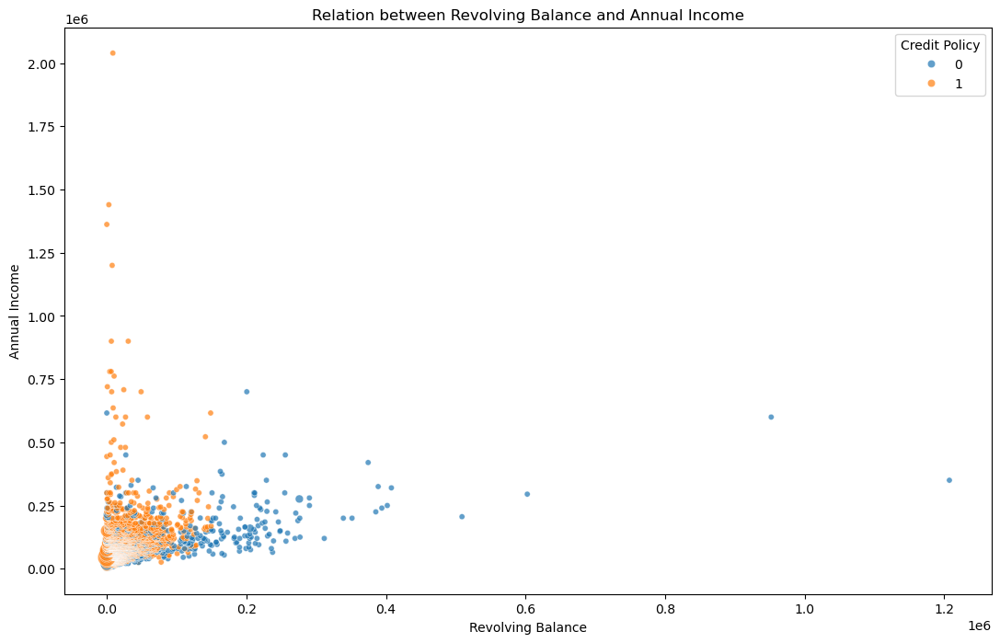

In [52]:
grp18 = df.groupby(["annual.inc", "revol.bal", "credit.policy"]).size().reset_index(name = "Count")
plt.subplots(figsize=(13, 8))
plt.title("Relation between Revolving Balance and Annual Income")
ax = sns.scatterplot(data=grp18, x="revol.bal", y="annual.inc", hue="credit.policy", size="Count", sizes=(20, 200), legend = True, alpha=0.7)
ax.set(xlabel="Revolving Balance", ylabel="Annual Income")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(legend_handles[1:3], [ '0','1'], title = "Credit Policy")
plt.show()

In [53]:
df[df["credit.policy"] == 1]["revol.bal"].max()

149527

#### All people with a Revolving Balance greater than $149527 do not qualify for Lending Club's Credit Policy.

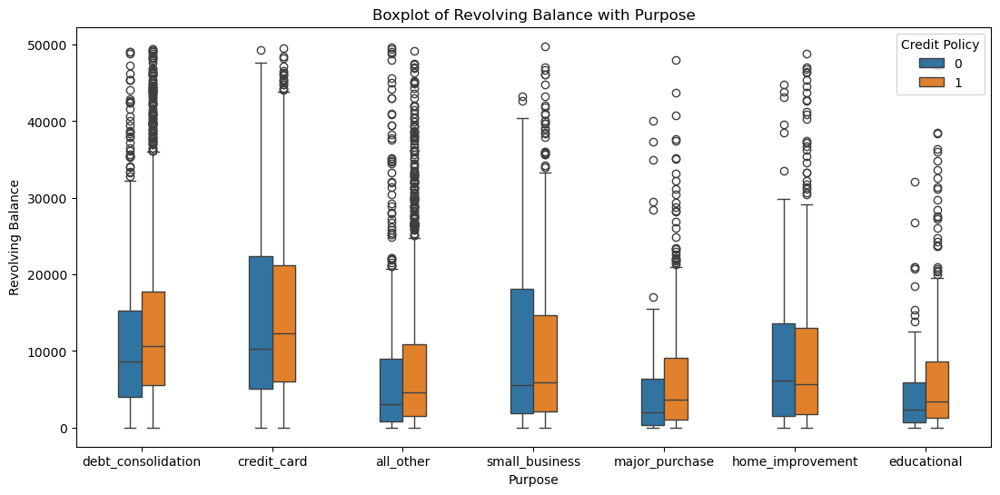

In [54]:
plt.subplots(figsize = (13, 6))
plt.title("Boxplot of Revolving Balance with Purpose")
ax = sns.boxplot(data = df[df["revol.bal"] <= 50000], x = "purpose", y = "revol.bal", hue = "credit.policy" , width= 0.35, legend=True)
ax.set(xlabel="Purpose", ylabel="Revolving Balance")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(title = "Credit Policy")
plt.show()

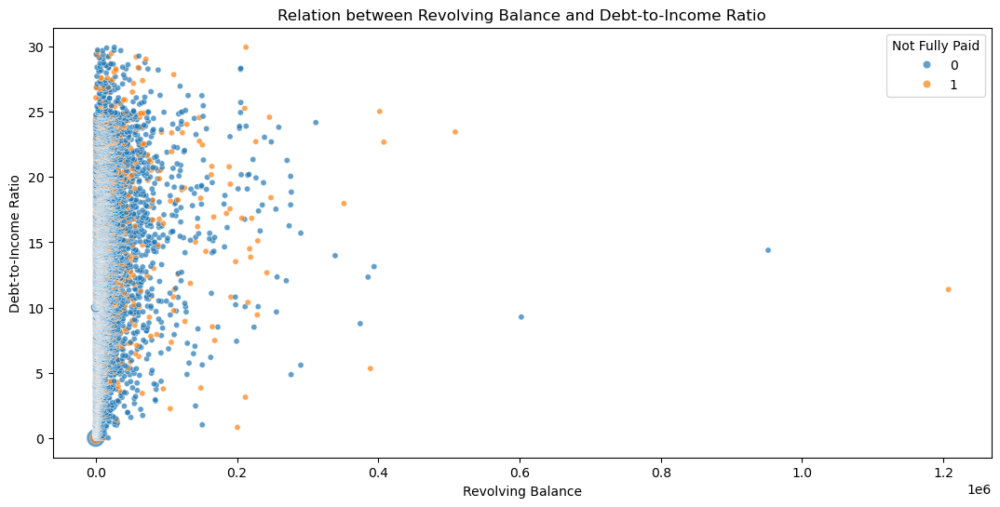

In [55]:
grp19 = df.groupby(["dti", "revol.bal", "not.fully.paid"]).size().reset_index(name = "Count")
plt.subplots(figsize=(13, 6))
plt.title("Relation between Revolving Balance and Debt-to-Income Ratio")
ax = sns.scatterplot(data=grp19, x="revol.bal", y="dti", hue="not.fully.paid", size="Count", sizes=(20, 200), legend = True, alpha=0.7)
ax.set(xlabel="Revolving Balance", ylabel="Debt-to-Income Ratio")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(legend_handles[1:3], [ '0','1'], title = "Not Fully Paid")
plt.show()

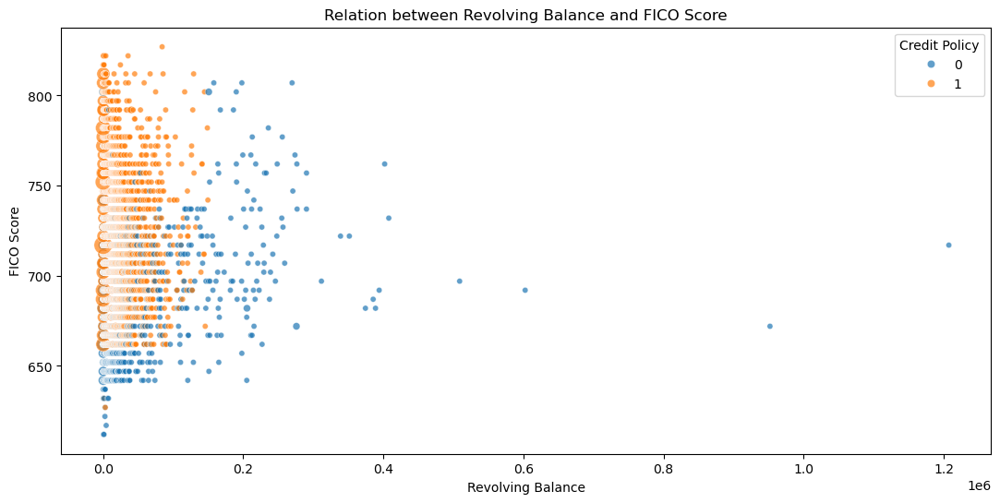

In [56]:
grp20 = df.groupby(["fico", "revol.bal", "credit.policy"]).size().reset_index(name = "Count")
plt.subplots(figsize=(13, 6))
plt.title("Relation between Revolving Balance and FICO Score")
ax = sns.scatterplot(data=grp20, x="revol.bal", y="fico", hue="credit.policy", size="Count", sizes=(20, 200), legend = True, alpha=0.7)
ax.set(xlabel="Revolving Balance", ylabel="FICO Score")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(legend_handles[1:3], [ '0','1'], title = "Credit Policy")
plt.show()

In [57]:
df["revol.util"].describe()

count    9578.000000
mean       46.799236
std        29.014417
min         0.000000
25%        22.600000
50%        46.300000
75%        70.900000
max       119.000000
Name: revol.util, dtype: float64

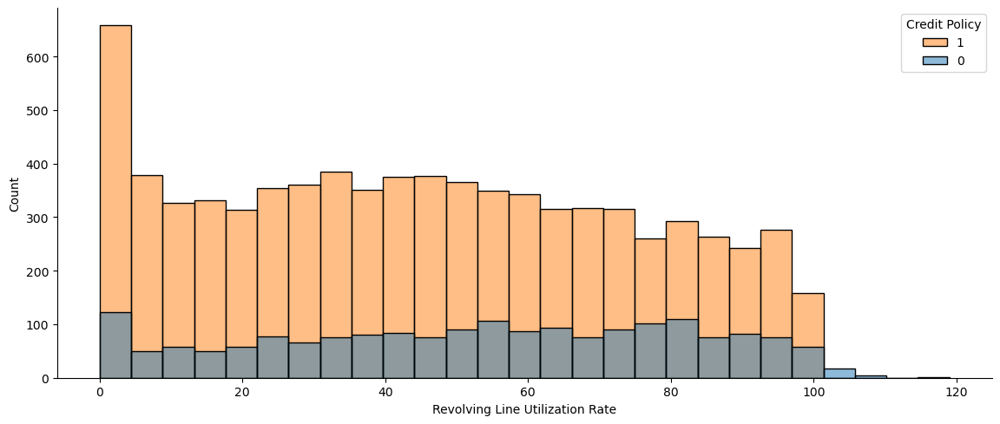

In [58]:
ax = sns.displot(df, x = "revol.util", hue = "credit.policy", legend=False)
ax.figure.set_size_inches(13,5)
ax.set(xlabel = "Revolving Line Utilization Rate")

plt.legend(title = "Credit Policy", labels = ['1','0'])
plt.show()

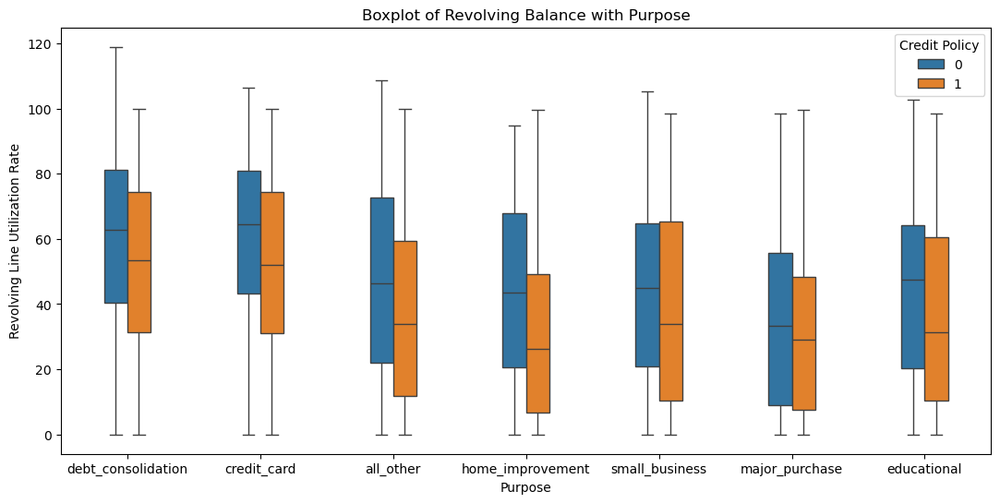

In [59]:
plt.subplots(figsize = (13, 6))
plt.title("Boxplot of Revolving Balance with Purpose")
ax = sns.boxplot(data = df, x = "purpose", y = "revol.util", hue = "credit.policy" , width= 0.35, legend=True)
ax.set(xlabel="Purpose", ylabel="Revolving Line Utilization Rate")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(title = "Credit Policy")
plt.show()

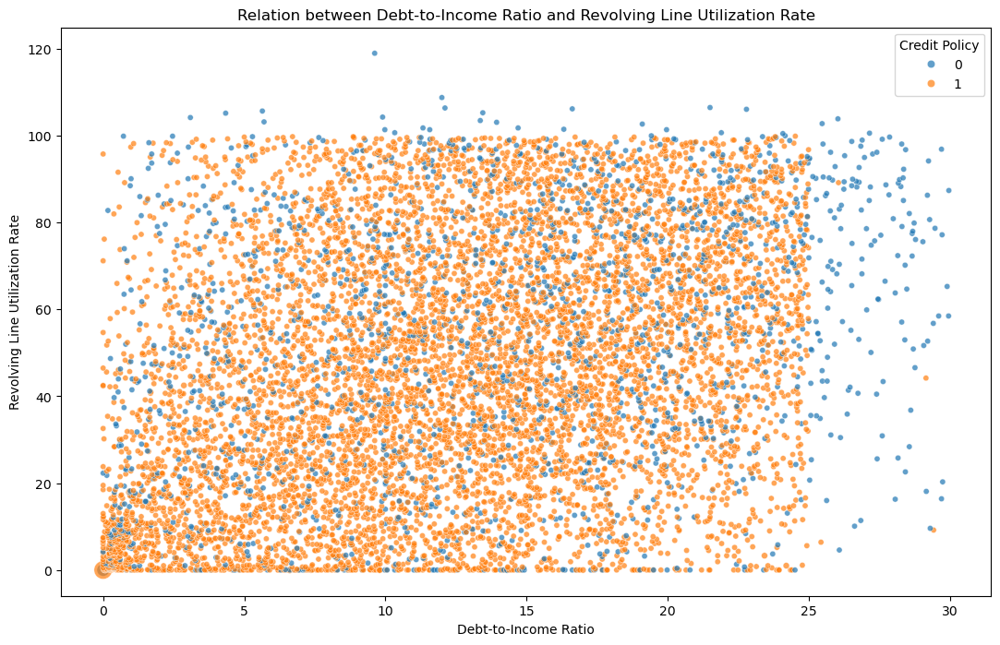

In [60]:
grp21 = df.groupby(["revol.util", "dti", "credit.policy"]).size().reset_index(name = "Count")
plt.subplots(figsize=(13, 8))
plt.title("Relation between Debt-to-Income Ratio and Revolving Line Utilization Rate")
ax = sns.scatterplot(data=grp21, x="dti", y="revol.util", hue="credit.policy", size="Count", sizes=(20, 200), legend = True, alpha=0.7)
ax.set(xlabel="Debt-to-Income Ratio", ylabel="Revolving Line Utilization Rate")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(legend_handles[1:3], [ '0','1'], title = "Credit Policy")
plt.show()

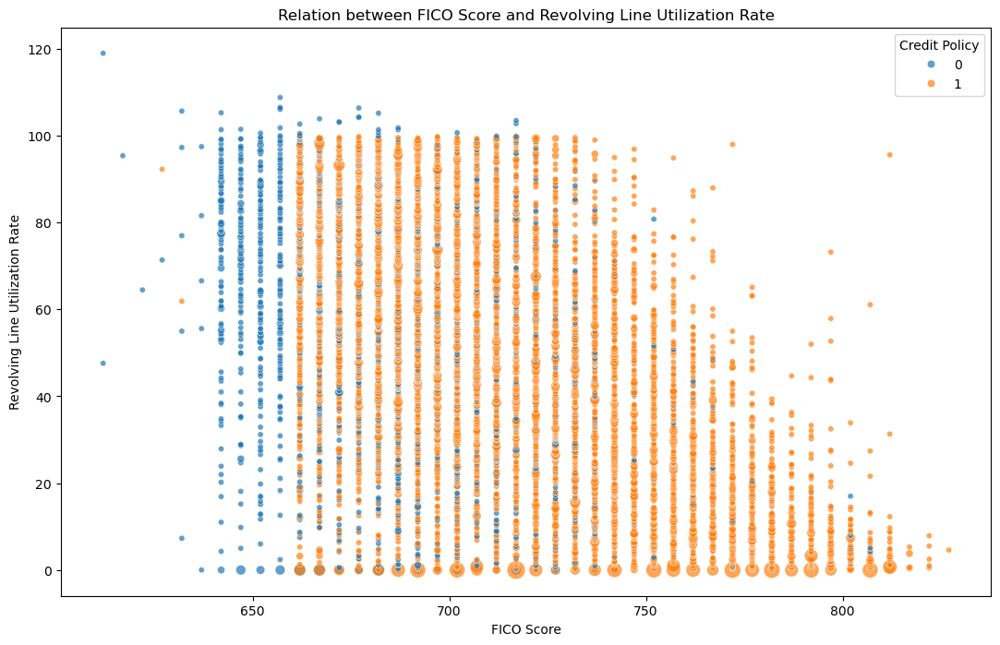

In [61]:
grp22 = df.groupby(["revol.util", "fico", "credit.policy"]).size().reset_index(name = "Count")
plt.subplots(figsize=(13, 8))
plt.title("Relation between FICO Score and Revolving Line Utilization Rate")
ax = sns.scatterplot(data=grp22, x="fico", y="revol.util", hue="credit.policy", size="Count", sizes=(20, 200), legend = True, alpha=0.7)
ax.set(xlabel="FICO Score", ylabel="Revolving Line Utilization Rate")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(legend_handles[1:3], [ '0','1'], title = "Credit Policy")
plt.show()

#### All people with a Revolving Line Utilization greater than 100% do not qualify for Lending Club's Credit Policy.

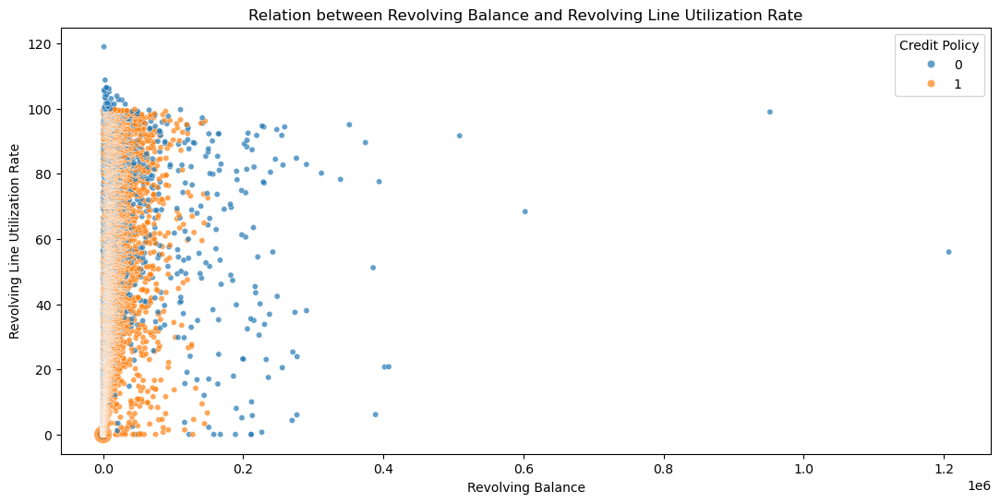

In [62]:
grp23 = df.groupby(["revol.util", "revol.bal", "credit.policy"]).size().reset_index(name = "Count")
plt.subplots(figsize=(13, 6))
plt.title("Relation between Revolving Balance and Revolving Line Utilization Rate")
ax = sns.scatterplot(data=grp23, x="revol.bal", y="revol.util", hue="credit.policy", size="Count", sizes=(20, 200), legend = True, alpha=0.7)
ax.set(xlabel="Revolving Balance", ylabel="Revolving Line Utilization Rate")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(legend_handles[1:3], [ '0','1'], title = "Credit Policy")
plt.show()

In [63]:
df["inq.last.6mths"].describe()

count    9578.000000
mean        1.577469
std         2.200245
min         0.000000
25%         0.000000
50%         1.000000
75%         2.000000
max        33.000000
Name: inq.last.6mths, dtype: float64

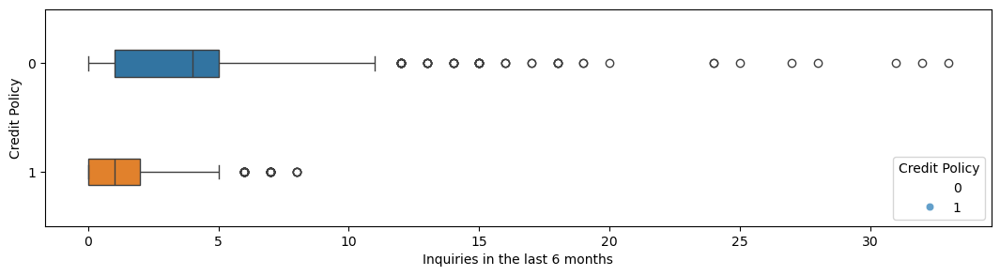

In [64]:
plt.subplots(figsize=(13, 3))
ax = sns.boxplot(df, x="inq.last.6mths", y="credit.policy", hue="credit.policy", orient="h", width=0.25)
# legend_handles, _= ax.get_legend_handles_labels()
ax.set(ylabel="Credit Policy", xlabel="Inquiries in the last 6 months")
ax.set_yticks([0, 1])
plt.legend(legend_handles, [ '0','1'], title = "Credit Policy")
plt.show()

#### People who have had more than 8 inquiries in the last 6 months, do not qualify for Lending Club's Credit Policy.
#### Most of the people who qualify for the Credit Poilcy have 2 or less inquiries in the last 6 months.

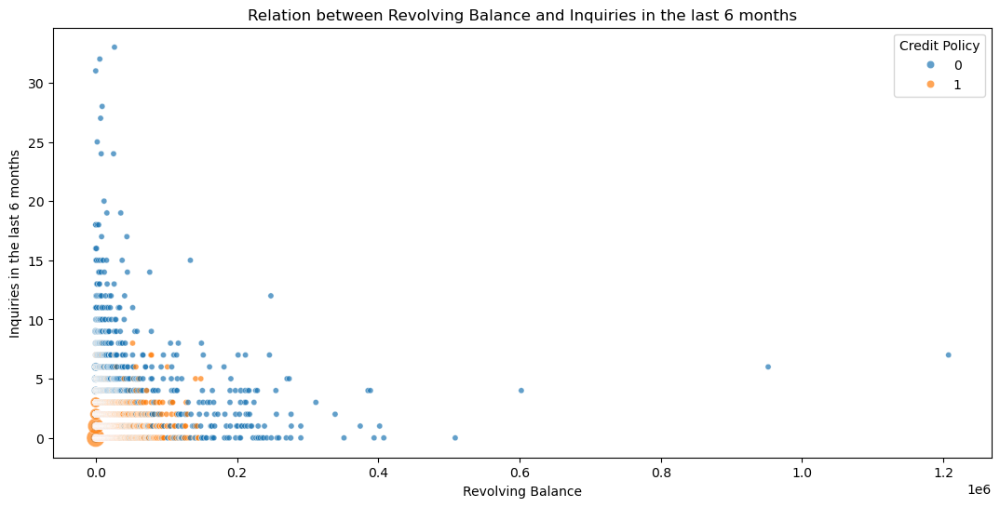

In [65]:
grp24 = df.groupby(["inq.last.6mths", "revol.bal", "credit.policy"]).size().reset_index(name = "Count")
plt.subplots(figsize=(13, 6))
plt.title("Relation between Revolving Balance and Inquiries in the last 6 months")
ax = sns.scatterplot(data=grp24, x="revol.bal", y="inq.last.6mths", hue="credit.policy", size="Count", sizes=(20, 200), legend = True, alpha=0.7)
ax.set(xlabel="Revolving Balance", ylabel="Inquiries in the last 6 months")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(legend_handles[1:3], [ '0','1'], title = "Credit Policy")
plt.show()

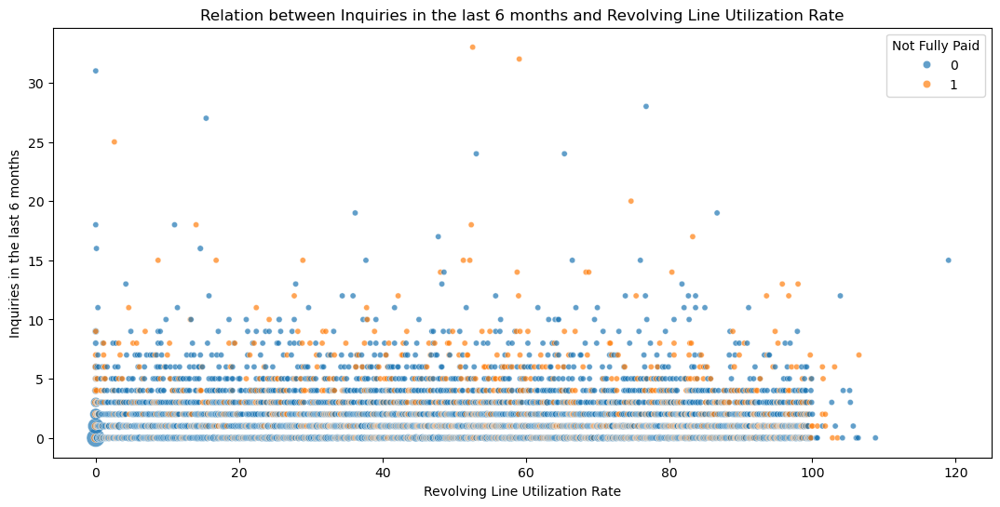

In [66]:
grp25 = df.groupby(["revol.util", "inq.last.6mths", "not.fully.paid"]).size().reset_index(name = "Count")
plt.subplots(figsize=(13, 6))
plt.title("Relation between Inquiries in the last 6 months and Revolving Line Utilization Rate")
ax = sns.scatterplot(data=grp25, x="revol.util", y="inq.last.6mths", hue="not.fully.paid", size="Count", sizes=(20, 200), legend = True, alpha=0.7)
ax.set(xlabel="Revolving Line Utilization Rate", ylabel="Inquiries in the last 6 months")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(legend_handles[1:3], [ '0','1'], title = "Not Fully Paid")
plt.show()

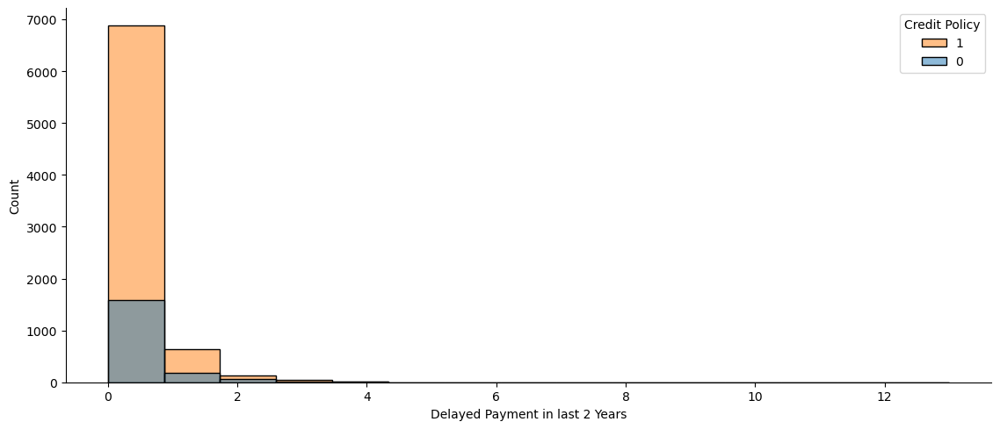

In [67]:
ax = sns.displot(df, x = "delinq.2yrs", hue = "credit.policy", legend=False)
ax.figure.set_size_inches(13,5)
ax.set(xlabel = "Delayed Payment in last 2 Years")

plt.legend(title = "Credit Policy", labels = ['1','0'])
plt.show()

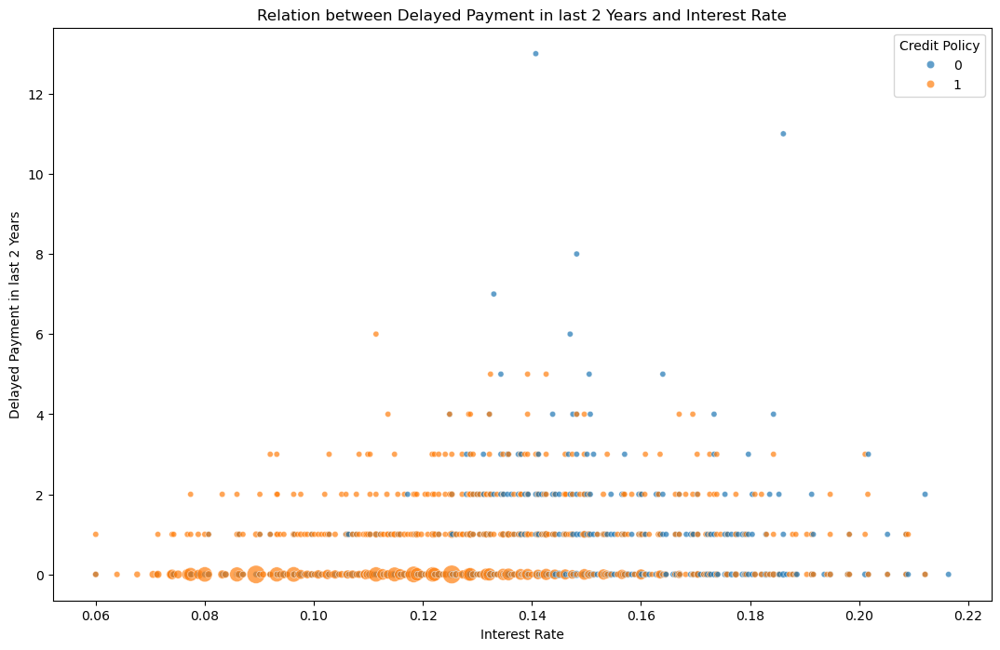

In [68]:
grp26 = df.groupby(["int.rate", "delinq.2yrs", "credit.policy"]).size().reset_index(name = "Count")
plt.subplots(figsize=(13, 8))
plt.title("Relation between Delayed Payment in last 2 Years and Interest Rate")
ax = sns.scatterplot(data=grp26, y="delinq.2yrs", x="int.rate", hue="credit.policy", size="Count", sizes=(20, 200), legend = True, alpha=0.7)
ax.set(ylabel="Delayed Payment in last 2 Years", xlabel="Interest Rate")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(legend_handles[1:3], [ '0','1'], title = "Credit Policy") # title = "Credit Policy", labels =
plt.show()

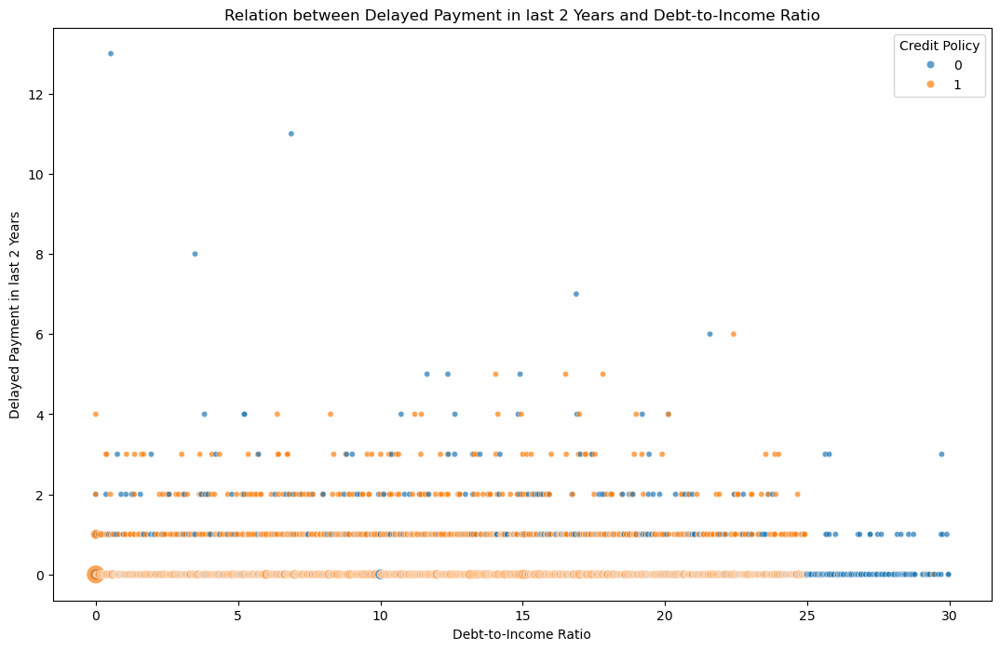

In [69]:
grp27 = df.groupby(["dti", "delinq.2yrs", "credit.policy"]).size().reset_index(name = "Count")
plt.subplots(figsize=(13, 8))
plt.title("Relation between Delayed Payment in last 2 Years and Debt-to-Income Ratio")
ax = sns.scatterplot(data=grp27, y="delinq.2yrs", x="dti", hue="credit.policy", size="Count", sizes=(20, 200), legend = True, alpha=0.7)
ax.set(ylabel="Delayed Payment in last 2 Years", xlabel="Debt-to-Income Ratio")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(legend_handles[1:3], [ '0','1'], title = "Credit Policy") # title = "Credit Policy", labels =
plt.show()

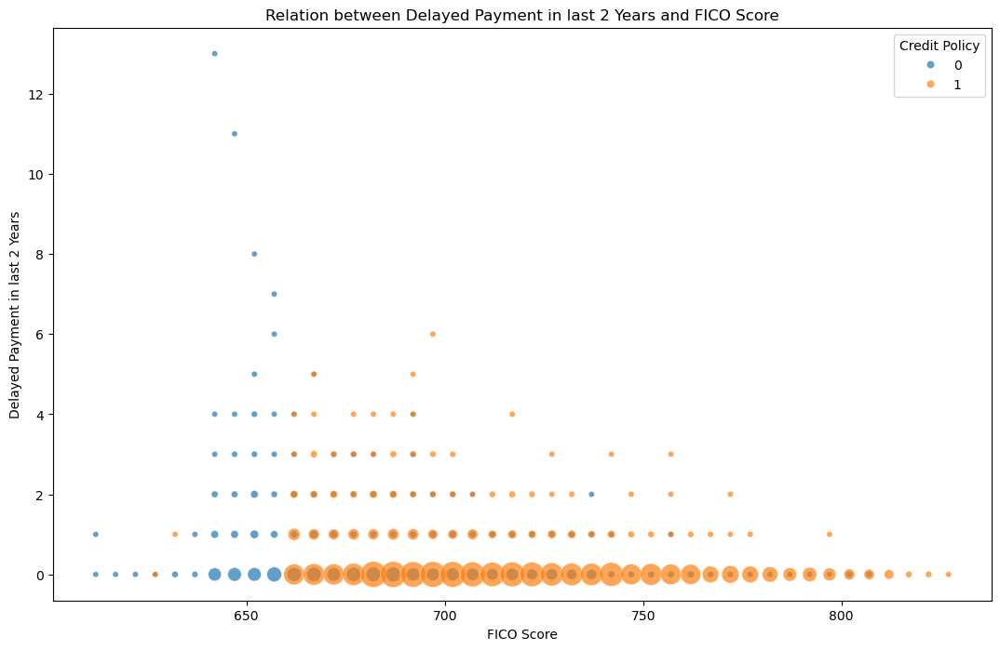

In [70]:
grp28 = df.groupby(["fico", "delinq.2yrs", "credit.policy"]).size().reset_index(name = "Count")
plt.subplots(figsize=(13, 8))
plt.title("Relation between Delayed Payment in last 2 Years and FICO Score")
ax = sns.scatterplot(data=grp28, y="delinq.2yrs", x="fico", hue="credit.policy", size="Count", sizes=(20, 400), legend = True, alpha=0.7)
ax.set(ylabel="Delayed Payment in last 2 Years", xlabel="FICO Score")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(legend_handles[1:3], [ '0','1'], title = "Credit Policy") # title = "Credit Policy", labels =
plt.show()

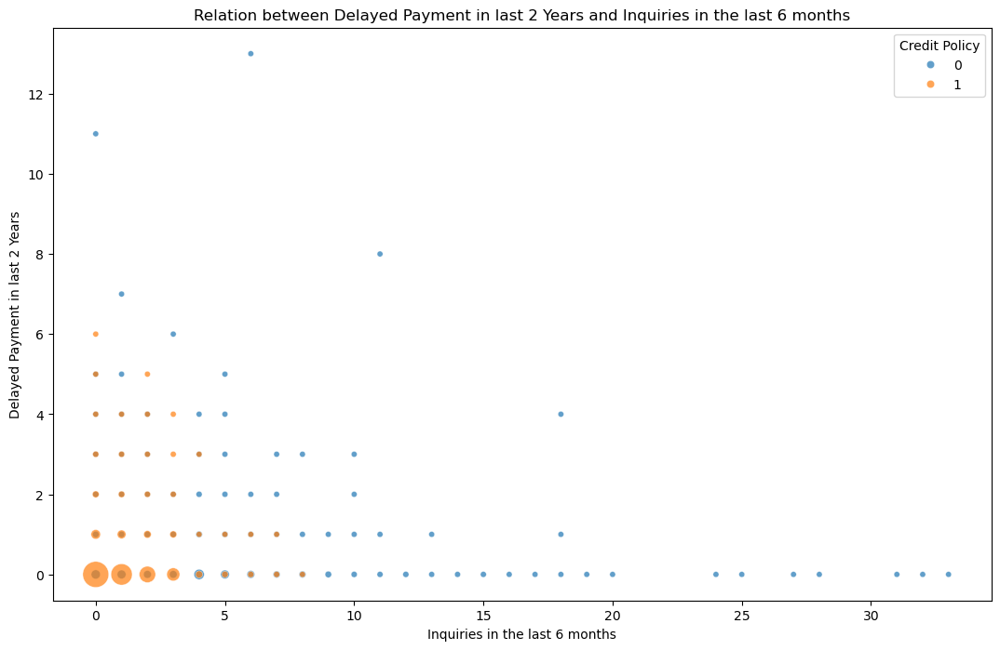

In [71]:
grp29 = df.groupby(["inq.last.6mths", "delinq.2yrs", "credit.policy"]).size().reset_index(name = "Count")
plt.subplots(figsize=(13, 8))
plt.title("Relation between Delayed Payment in last 2 Years and Inquiries in the last 6 months")
ax = sns.scatterplot(data=grp29, y="delinq.2yrs", x="inq.last.6mths", hue="credit.policy", size="Count", sizes=(20, 400), legend = True, alpha=0.7)
ax.set(ylabel="Delayed Payment in last 2 Years", xlabel="Inquiries in the last 6 months")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(legend_handles[1:3], [ '0','1'], title = "Credit Policy") # title = "Credit Policy", labels =
plt.show()

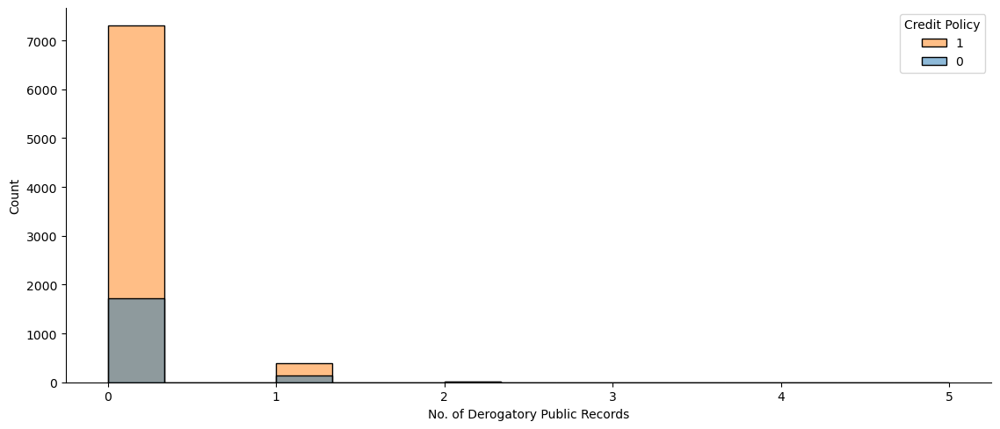

In [72]:
ax = sns.displot(df, x = "pub.rec", hue = "credit.policy", legend=False)
ax.figure.set_size_inches(13,5)
ax.set(xlabel = "No. of Derogatory Public Records")

plt.legend(title = "Credit Policy", labels = ['1','0'])
plt.show()

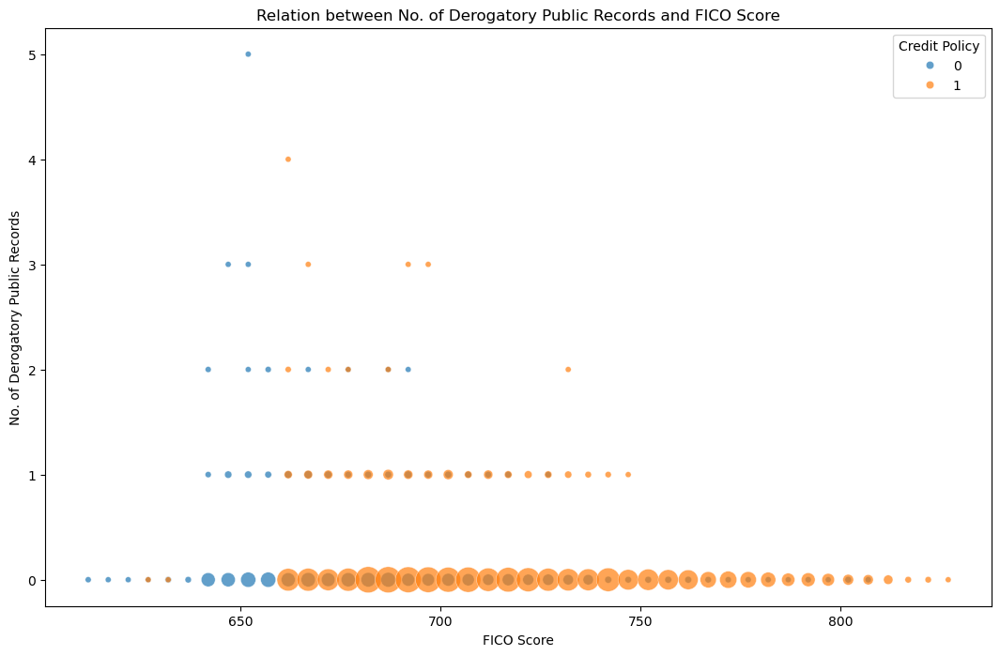

In [73]:
grp30 = df.groupby(["fico", "pub.rec", "credit.policy"]).size().reset_index(name = "Count")
plt.subplots(figsize=(13, 8))
plt.title("Relation between No. of Derogatory Public Records and FICO Score")
ax = sns.scatterplot(data=grp30, y="pub.rec", x="fico", hue="credit.policy", size="Count", sizes=(20, 400), legend = True, alpha=0.7)
ax.set(ylabel="No. of Derogatory Public Records", xlabel="FICO Score")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(legend_handles[1:3], [ '0','1'], title = "Credit Policy") # title = "Credit Policy", labels =
plt.show()

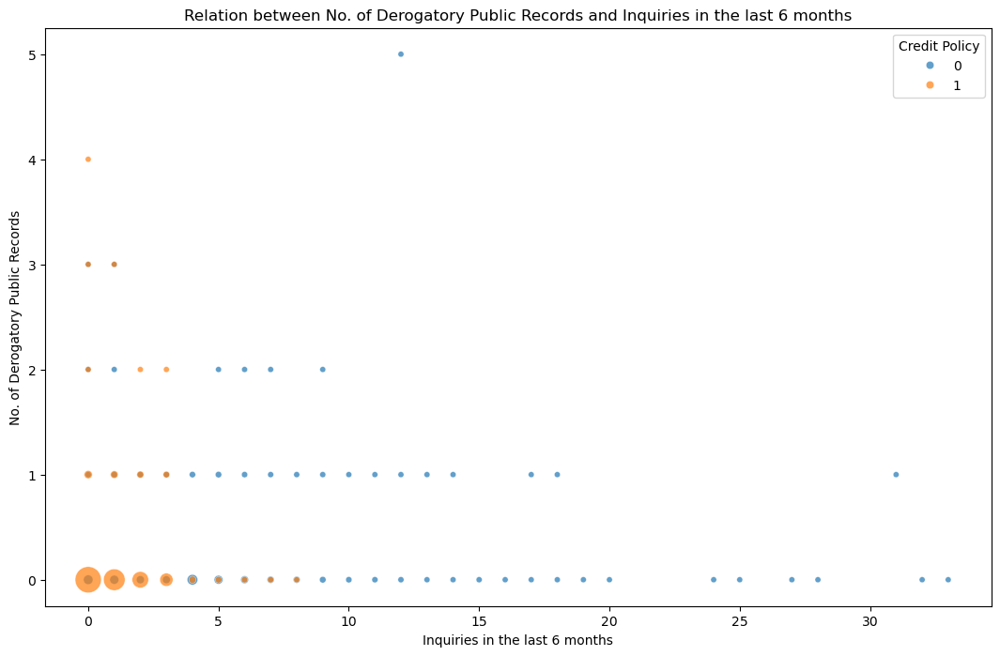

In [74]:
grp31 = df.groupby(["inq.last.6mths", "pub.rec", "credit.policy"]).size().reset_index(name = "Count")
plt.subplots(figsize=(13, 8))
plt.title("Relation between No. of Derogatory Public Records and Inquiries in the last 6 months")
ax = sns.scatterplot(data=grp31, y="pub.rec", x="inq.last.6mths", hue="credit.policy", size="Count", sizes=(20, 400), legend = True, alpha=0.7)
ax.set(ylabel="No. of Derogatory Public Records", xlabel="Inquiries in the last 6 months")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(legend_handles[1:3], [ '0','1'], title = "Credit Policy") # title = "Credit Policy", labels =
plt.show()

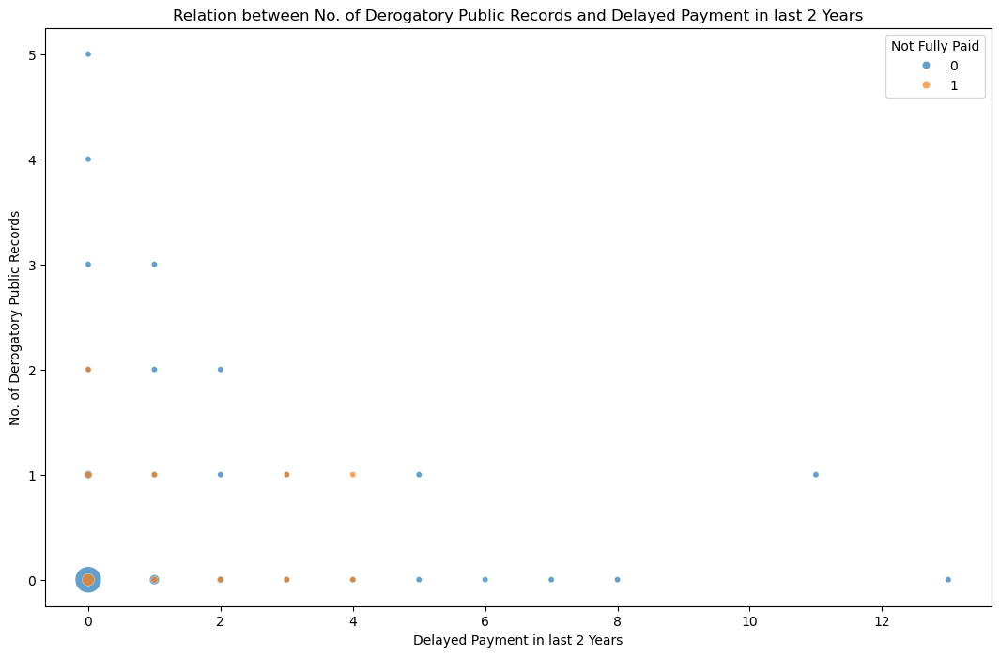

In [75]:
grp32 = df.groupby(["delinq.2yrs", "pub.rec", "not.fully.paid"]).size().reset_index(name = "Count")
plt.subplots(figsize=(13, 8))
plt.title("Relation between No. of Derogatory Public Records and Delayed Payment in last 2 Years")
ax = sns.scatterplot(data=grp32, y="pub.rec", x="delinq.2yrs", hue="not.fully.paid", size="Count", sizes=(20, 400), legend = True, alpha=0.7)
ax.set(ylabel="No. of Derogatory Public Records", xlabel="Delayed Payment in last 2 Years")
legend_handles, _= ax.get_legend_handles_labels()
plt.legend(legend_handles[1:3], [ '0','1'], title = "Not Fully Paid") # title = "Credit Policy", labels =
plt.show()

### Data Preparation for Model Training

In [76]:
data_df = original_df.copy()

In [77]:
data_df = pd.get_dummies(data=data_df, columns=["purpose"], drop_first=True)
data_df.head(5)

,credit.policy,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid,purpose_credit_card,purpose_debt_consolidation,purpose_educational,purpose_home_improvement,purpose_major_purchase,purpose_small_business
0,1,0.1189,829.10,11.350407,19.48,737,5639.958333,28854,52.1,0,0,0,0,False,True,False,False,False,False
1,1,0.1071,228.22,11.082143,14.29,707,2760.000000,33623,76.7,0,0,0,0,True,False,False,False,False,False
2,1,0.1357,366.86,10.373491,11.63,682,4710.000000,3511,25.6,1,0,0,0,False,True,False,False,False,False
3,1,0.1008,162.34,11.350407,8.10,712,2699.958333,33667,73.2,1,0,0,0,False,True,False,False,False,False
4,1,0.1426,102.92,11.299732,14.97,667,4066.000000,4740,39.5,0,1,0,0,True,False,False,False,False,False


In [78]:
scaler = MinMaxScaler()
smote = SMOTE(random_state=123, sampling_strategy = 0.33)

In [79]:
x = data_df.drop(["not.fully.paid"], axis=1)
x.head()

,credit.policy,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,purpose_credit_card,purpose_debt_consolidation,purpose_educational,purpose_home_improvement,purpose_major_purchase,purpose_small_business
0,1,0.1189,829.10,11.350407,19.48,737,5639.958333,28854,52.1,0,0,0,False,True,False,False,False,False
1,1,0.1071,228.22,11.082143,14.29,707,2760.000000,33623,76.7,0,0,0,True,False,False,False,False,False
2,1,0.1357,366.86,10.373491,11.63,682,4710.000000,3511,25.6,1,0,0,False,True,False,False,False,False
3,1,0.1008,162.34,11.350407,8.10,712,2699.958333,33667,73.2,1,0,0,False,True,False,False,False,False
4,1,0.1426,102.92,11.299732,14.97,667,4066.000000,4740,39.5,0,1,0,True,False,False,False,False,False


In [80]:
y = data_df["not.fully.paid"]
y.head()

0    0
1    0
2    0
3    0
4    0
Name: not.fully.paid, dtype: int64

In [81]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=123)

In [82]:
x_train_sc = scaler.fit_transform(x_train)
x_test_sc = scaler.transform(x_test)

In [83]:
x_train_smote, y_train_smote = smote.fit_resample(x_train_sc, y_train)

In [84]:
x_train_smote.shape

(7515, 18)

In [85]:
model = keras.Sequential()

model.add(layers.Input(shape=(18,)))

model.add(layers.Dense(128, activation = 'relu'))
model.add(layers.Dense(32, activation = 'relu'))
model.add(layers.Dense(64, activation = 'relu'))
model.add(layers.Dense(128, activation = 'relu'))
model.add(layers.Dense(16, activation = 'relu'))

model.add(layers.Dense(1, activation = 'sigmoid'))

model.compile(optimizer = keras.optimizers.Adam(learning_rate = 0.001), loss = 'binary_crossentropy' , metrics = ['auc'])

In [86]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 128)                 │           2,432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 32)                  │           4,128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 128)                 │           8,320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 16)                  │           2,064 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 1)                   │              17 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,073 (74.50 KB)

 Trainable params: 19,073 (74.50 KB)

 Non-trainable params: 0 (0.00 B)

In [87]:
early_stopping = EarlyStopping(monitor = 'val_auc', mode="max", patience = 20, restore_best_weights = True)
history = model.fit(x_train_smote, y_train_smote, epochs = 100, validation_data = (x_test_sc, y_test), callbacks = [early_stopping])

Epoch 1/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - auc: 0.5776 - loss: 0.5639 - val_auc: 0.6675 - val_loss: 0.4553
Epoch 2/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - auc: 0.6622 - loss: 0.5224 - val_auc: 0.6686 - val_loss: 0.4627
Epoch 3/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6715 - loss: 0.5240 - val_auc: 0.6757 - val_loss: 0.4320
Epoch 4/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - auc: 0.6831 - loss: 0.5154 - val_auc: 0.6746 - val_loss: 0.4472
Epoch 5/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6883 - loss: 0.5086 - val_auc: 0.6729 - val_loss: 0.4531
Epoch 6/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - auc: 0.7016 - loss: 0.5130 - val_auc: 0.6775 - val_loss: 0.4371
Epoch 7/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - auc: 0.7052 - loss: 0.4956 - val_auc: 0.6766 - val_loss: 0.4309
Epoch 8/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7147 - loss: 0.4997 - val_auc: 0.6818 - val_loss: 0.4305
Epoch 9/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/

In [88]:
test_loss, test_acc = model.evaluate(x_test_sc, y_test)
print(f'Test Accuracy: {test_acc}')

90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - auc: 0.6840 - loss: 0.4208  
Test Accuracy: 0.6818495988845825


In [89]:
pred = model.predict(x_test_sc).ravel()

90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


In [90]:
pred_c = np.round(pred, decimals=0)

#### Confusion Matrix

In [91]:
print(confusion_matrix(y_test, pred_c))

[[2338   56]
 [ 440   40]]


#### Classification Report

In [92]:
print(classification_report(y_test, pred_c))

              precision    recall  f1-score   support

           0       0.84      0.98      0.90      2394
           1       0.42      0.08      0.14       480

    accuracy                           0.83      2874
   macro avg       0.63      0.53      0.52      2874
weighted avg       0.77      0.83      0.78      2874



#### ROC/AUC Curve

In [93]:
fpr, tpr, thresholds = roc_curve(y_test, pred)

In [94]:
auc_nn = auc(fpr, tpr)

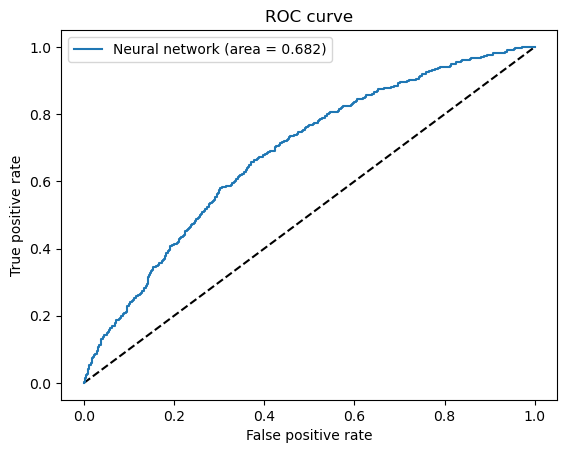

In [95]:
plt.figure(1)
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr, label='Neural network (area = {:.3f})'.format(auc_nn))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.show()